# All data and code for SatGEM_Circumpolar_JGR is found in this notebook:

## Preliminary: Load in the SSH and mask an area

In [130]:
import xarray as xr

ssh_thermosteric = xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/ssh_thermosteric.nc').__xarray_dataarray_variable__
ssh_circumpolar_mean = ssh_thermosteric.mean(dim='time',skipna=False)


/g/data/xp65/public/apps/med_conda/envs/analysis3-25.10/lib/python3.11/site-packages/cartopy/mpl/geoaxes.py:1585: UserWarning: The following kwargs were not used by contour: 'labels'
  result = super().contour(*args, **kwargs)


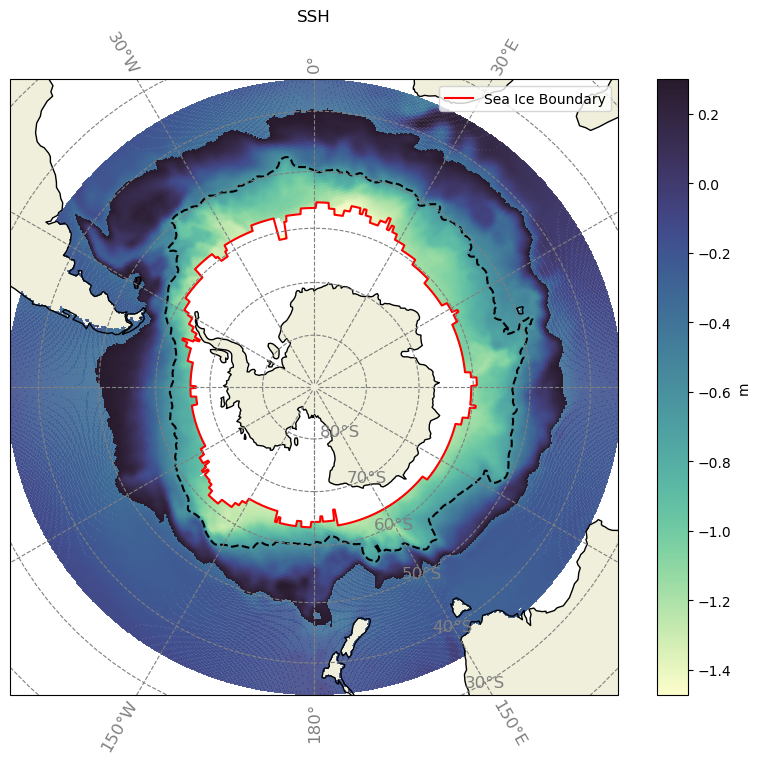

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cmocean


# Select the data for longitude = 0.125
data_at_0_125 = ssh_circumpolar_mean.sel(longitude=0.125)

# Assign this data to a new longitude = 360.125
data_at_360_125 = data_at_0_125.assign_coords(longitude=360.125)

# Concatenate the new longitude data with the existing dataset
ssh_with_360_125 = xr.concat([ssh_circumpolar_mean, data_at_360_125], dim='longitude')

# Sort the longitudes to maintain the correct order
ssh_with_360_125 = ssh_with_360_125.sortby('longitude')


# Assume mean_ssh_with_nans is a 2D array (lat x lon) with coordinates latitude and longitude
longitude = ssh_with_360_125.longitude.values
latitude = ssh_with_360_125.latitude.values
data = ssh_with_360_125

sie_mask = np.full(longitude.shape, np.nan)

# Create a copy of your original data to mask
data_masked = xr.full_like(data, np.nan)

gap_threshold = 10  # number of grid cells considered a gap

for i, lon in enumerate(longitude):
    column = data[:, i].values  # SSH column at this longitude
    valid = ~np.isnan(column)
    
    if not np.any(valid):
        continue

    # Find the first valid SSH value <= 0.3 (southernmost)
    below_thresh = column <= 0.3
    below_thresh_indices = np.where(below_thresh & valid)[0]
    
    if len(below_thresh_indices) == 0:
        continue

    southernmost_index = below_thresh_indices[0]
    sie_mask[i] = latitude[southernmost_index]

    # Search northward for any gap of `gap_threshold` where SSH > 0.3
    north_of_edge = column[southernmost_index + 1:]
    above_thresh = north_of_edge > 0.3

    # Run-length encode to find gaps of 5 or more
    gap_length = 0
    for j, val in enumerate(above_thresh):
        if val:
            gap_length += 1
        else:
            if gap_length >= gap_threshold:
                # Mask everything from this point onward
                cutoff_index = southernmost_index + 1 + j
                column[cutoff_index:] = np.nan
                break
            gap_length = 0

    # Apply threshold mask (retain only values <= 0.3)
    column[column > 0.3] = np.nan

    # Save masked column back into masked data
    data_masked[:, i] = column


mask = ssh_with_360_125 <= 0.45

# Use xarray's where function to assign values only where the mask is true
data_masked = data_masked.where(~mask, 
    data)

# Plotting
fig, ax = plt.subplots(figsize=(10, 8), subplot_kw={'projection': ccrs.SouthPolarStereo()})

# Add features such as coastlines and land
ax.coastlines()
ax.add_feature(cfeature.LAND)

# Set the extent (latitude in southern hemisphere and longitude)
ax.set_extent([-180, 180, -80, -35], crs=ccrs.PlateCarree())

# Plot the temperature data
temp = ax.pcolormesh(
    longitude, latitude, ssh_circumpolar_mean, 
    shading='nearest', cmap=cmocean.cm.deep, 
    transform=ccrs.PlateCarree(), alpha = 0.9
)

temp = ax.pcolormesh(
    longitude, latitude, data_masked, 
    shading='nearest', cmap=cmocean.cm.deep, 
    transform=ccrs.PlateCarree()
)

# Add the southern boundary contour
ax.plot(longitude, sie_mask, 'r-', transform=ccrs.PlateCarree(), label='Sea Ice Boundary')

plt.contour(    ssh_circumpolar_mean.longitude, 
    ssh_circumpolar_mean.latitude, 
    ssh_circumpolar_mean, levels =[-0.65], colors='k', labels='PF',transform=ccrs.PlateCarree())


# Add a colorbar with the appropriate label
cbar = plt.colorbar(temp, ax=ax, orientation='vertical', label='m')

# Add gridlines and labels
gl = ax.gridlines(draw_labels=True, xlocs=range(-180, 181, 30), linestyle='--', color='gray')
gl.top_labels = True
gl.bottom_labels = True
gl.right_labels = True
gl.left_labels = True
gl.xlabel_style = {'size': 12, 'color': 'gray'}
gl.ylabel_style = {'size': 12, 'color': 'gray'}

# Add a title and legend
plt.title('SSH')
plt.legend(loc='upper right')

# Display the map
plt.show()


In [3]:
area_mask = data_masked.isnull()


# Figure 1: All the data used

In [5]:
argo_pts = xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/argo_points.nc')


In [8]:
argo_pts

<xarray.Dataset> Size: 4MB
Dimensions:  (obs: 130679)
Coordinates:
  * obs      (obs) int64 1MB 0 1 2 3 4 5 ... 130674 130675 130676 130677 130678
Data variables:
    lon      (obs) float64 1MB ...
    lat      (obs) float64 1MB ...
    dyn_m    (obs) float64 1MB ...

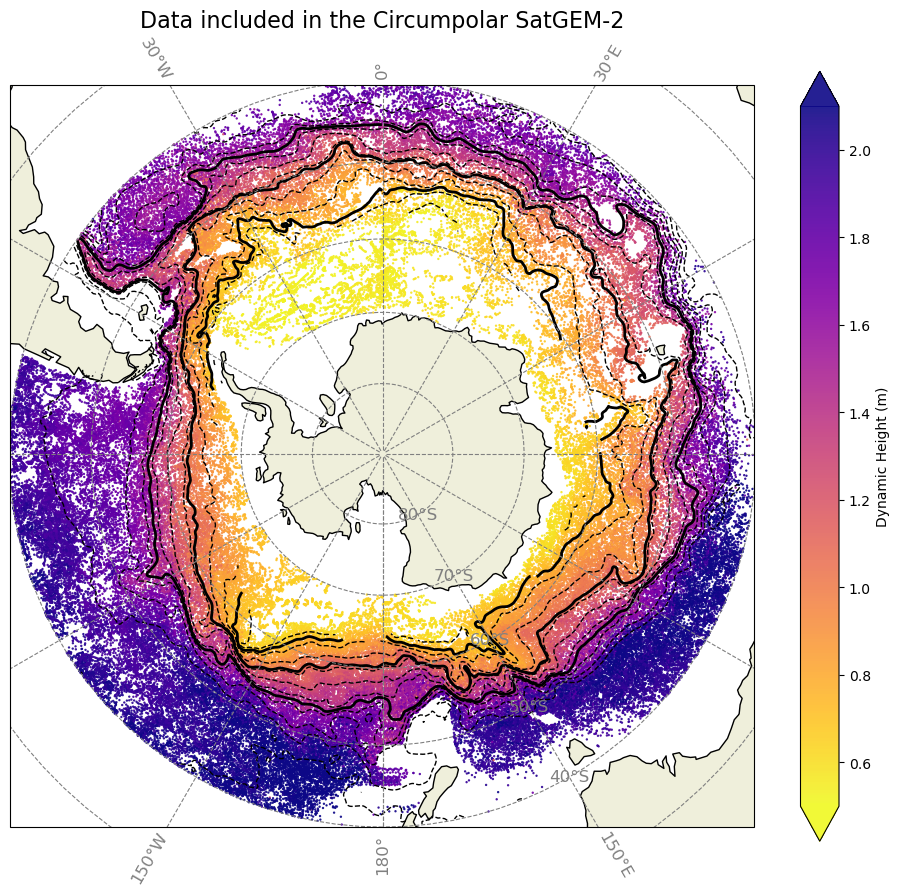

In [9]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cmocean


# Plotting
fig, ax = plt.subplots(figsize=(12, 10), subplot_kw={'projection': ccrs.SouthPolarStereo()})

# Add features such as coastlines and land
ax.coastlines()
ax.add_feature(cfeature.LAND)

# Set the extent (latitude in southern hemisphere and longitude)
ax.set_extent([-180, 180, -80, -40], crs=ccrs.PlateCarree())


# Add the southern boundary contour
ssh_levels = np.arange(-1.4,1.0,0.2)
plt.contour(    ssh_circumpolar_mean.longitude, 
    ssh_circumpolar_mean.latitude[:160], 
    ssh_circumpolar_mean[:160], levels=ssh_levels, colors='k', linestyles='--',linewidths =1, transform=ccrs.PlateCarree())
plt.contour(    ssh_circumpolar_mean.longitude, 
    ssh_circumpolar_mean.latitude[:160], 
    ssh_circumpolar_mean[:160], levels=[-1.11,-0.65, -0.1], colors='k',linestyles='-', linewidths=2, transform=ccrs.PlateCarree())

# Plot the scatter points with a different color map
scatter = ax.scatter(argo_pts.lon, argo_pts.lat, s=0.5, 
                     c=argo_pts.dyn_m, cmap='plasma_r', 
                     vmin=0.5, vmax=2.1, 
                     transform=ccrs.PlateCarree(), alpha=0.9)

# Add a colorbar for the scatter plot with the limits specified
cbar_scatter = plt.colorbar(scatter, ax=ax, orientation='vertical', 
                            label='Dynamic Height (m)', 
                            extend='both')  # 'both' add
# Add a colorbar with the appropriate label
# cbar = plt.colorbar(temp, ax=ax, orientation='vertical', label='SSH (m)' , extend='both')

# # Add gridlines and labels
gl = ax.gridlines(draw_labels=True, xlocs=range(-180, 181, 30), linestyle='--', color='gray')
gl.top_labels = True
gl.bottom_labels = True
gl.right_labels = True
gl.left_labels = True
gl.xlabel_style = {'size': 12, 'color': 'gray'}
gl.ylabel_style = {'size': 12, 'color': 'gray'}

# Add a title and legend
plt.title('Data included in the Circumpolar SatGEM-2', fontsize=16)

# Display the map
plt.show()


# Figure 2: Removing the Barystatic Component

In [137]:
ssh_raw = xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/ssh_raw.nc').adt
barystatic = xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/barystatic.nc')
atmospheric_correction = xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/atmospheric_correction.nc')

In [138]:
# ssh_raw = xr.open_dataset('/g/data/jk72/jw2777/Paper_2_data_WM/Updated_SSH/SSH_1993_2023_monthly.nc').adt.sel(latitude=slice(-80,-35))
# barystatic = xr.open_dataset('/g/data/jk72/jw2777/Paper_1_edits/CSR_GRACE_GRACE-FO_RL0603_Mascons_all-corrections.nc').sel(lat=slice(-80,-35))
# atmospheric_correction = xr.open_dataset('/g/data/jk72/jw2777/Paper_2_scripts/SAF_and_south/CSR_GRACE_GRACE-FO_RL0603_Mascons_GAD-component.nc')

# Manually convert "days since 2002-01-01"
base_time = np.datetime64("2002-01-01")
atmospheric_correction['time'] = base_time + atmospheric_correction.time.astype("timedelta64[D]")
barystatic['time'] = base_time + barystatic.time.astype("timedelta64[D]")

atm_part = atmospheric_correction.sel(time=slice('1993-01-01','2023-12-31')).sel(lat=slice(-80,-35)).lwe_thickness.where(~area_mask[:,:1440].values)
barystatic_part = barystatic.sel(time=slice('1993-01-01','2023-12-31')).lwe_thickness.where(~area_mask[:,:1440].values)

barystatic_corrected = barystatic_part - atm_part

sla = ssh_raw - ssh_raw.sel(time=slice('2004-01-01','2009-12-01')).mean(dim='time')

tsa = ssh_thermosteric - ssh_raw.sel(time=slice('2004-01-01','2009-12-01')).mean(dim='time')

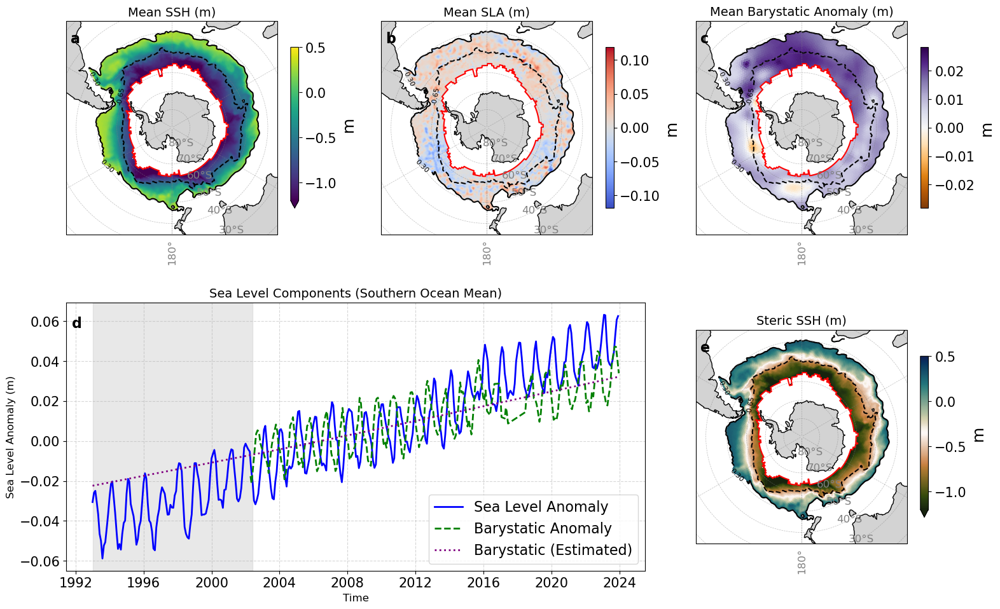

In [139]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import pandas as pd
import xarray as xr
import cmocean 

# Compute means
ssh_mean = ssh_raw.mean(dim='time').where(~area_mask)
sla_mean = sla.mean(dim='time').where(~area_mask)
ba_corrected = barystatic_corrected.mean(dim='time') / 100  # cm → m
ssh_thermosteric_mean = ssh_thermosteric.mean(dim='time').where(~area_mask)

# Time series data
sla_ts = sla.mean(dim=('latitude', 'longitude'))
tsa_ts = tsa.mean(dim=('latitude', 'longitude'))
ba_ts = barystatic_corrected.mean(dim=('lat', 'lon')) / 100
ba_estimated_ts = (sla - tsa).mean(dim=('latitude', 'longitude'))

# Create figure
fig = plt.figure(figsize=(16, 10))
gs = fig.add_gridspec(2, 3, height_ratios=[1, 1])

# === Top Row: Map Panels ===
proj = ccrs.SouthPolarStereo()
extent = [-180, 180, -90, -35]  # adjust as needed

def plot_map(ax, data, title, cmap='viridis', vmin=None, vmax=None):
    ax.set_extent(extent, crs=ccrs.PlateCarree())
    ax.coastlines()
    ax.add_feature(cfeature.LAND, zorder=0, facecolor='lightgray')

    # Plot the SSH/SLA/BA field
    p = data.plot(
        ax=ax,
        transform=ccrs.PlateCarree(),
        cmap=cmap,
        vmin=vmin,
        vmax=vmax,
        cbar_kwargs={'shrink': 0.6, 'label': 'm'},
    )

    # Add sea ice edge (red line)
    ax.plot(longitude, sie_mask, 'r-', transform=ccrs.PlateCarree(), label='Sea Ice Edge')

    # Add PF contours from ssh_circumpolar_mean
    contour = ax.contour(
        ssh_circumpolar_mean.longitude,
        ssh_circumpolar_mean.latitude,
        ssh_circumpolar_mean,
        levels=[-0.65, 0.3],
        colors='k',
        transform=ccrs.PlateCarree()
    )

    ax.clabel(contour, inline=True, fontsize=8, fmt='%0.2f')

    # Add gridlines
    gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
    # gl.ylocator = plt.MaxNLocator(4)
    # gl.xlocator = plt.MaxNLocator(6)
    gl.top_labels = False
    gl.bottom_labels = True
    gl.right_labels = True
    gl.left_labels = False
    gl.xlabel_style = {'size': 12, 'color': 'gray'}
    gl.ylabel_style = {'size': 12, 'color': 'gray'}
    ax.set_title(title, fontsize=14)
    return p


# Panel 1: SSH
ax1 = fig.add_subplot(gs[0, 0], projection=proj)
plot_map(ax1, ssh_mean, 'Mean SSH (m)', cmap='viridis', vmin=-1.2,vmax=0.5)
ax1.text(0.02, 0.95, 'a', transform=ax1.transAxes, fontsize=16, fontweight='bold', va='top')

# Panel 2: SLA
ax2 = fig.add_subplot(gs[0, 1], projection=proj)
plot_map(ax2, sla_mean, 'Mean SLA (m)', cmap='coolwarm')
ax2.text(0.02, 0.95, 'b', transform=ax2.transAxes, fontsize=16, fontweight='bold', va='top')

# Panel 3: Barystatic Anomaly
ax3 = fig.add_subplot(gs[0, 2], projection=proj)
plot_map(ax3, ba_corrected, 'Mean Barystatic Anomaly (m)', cmap='PuOr')
ax3.text(0.02, 0.95, 'c', transform=ax3.transAxes, fontsize=16, fontweight='bold', va='top')

# === Bottom Row ===

# Panel 4: Time series (2 columns wide)
ax4 = fig.add_subplot(gs[1, 0:2])
ax4.plot(sla_ts['time'], sla_ts, label='Sea Level Anomaly', color='blue', linewidth=2)
# ax4.plot(tsa_ts['time'], tsa_ts, label='TSA', color='red', linewidth=2)
ax4.plot(ba_ts['time'], ba_ts, label='Barystatic Anomaly', color='green', linestyle='--', linewidth=2)
ax4.plot(ba_estimated_ts['time'], ba_estimated_ts, label='Barystatic (Estimated)', color='purple', linestyle=':', linewidth=2)
ax4.axvspan(pd.to_datetime("1993-01-01"), pd.to_datetime("2002-06-01"), color='lightgray', alpha=0.5, zorder=0)

ax4.set_title('Sea Level Components (Southern Ocean Mean)', fontsize=14)
ax4.set_ylabel('Sea Level Anomaly (m)', fontsize=12)
ax4.set_xlabel('Time', fontsize=12)
ax4.grid(True, linestyle='--', alpha=0.5)
ax4.legend()
ax4.text(0.01, 0.95, 'd', transform=ax4.transAxes, fontsize=16, fontweight='bold', va='top')

# Panel 5: SSH Thermosteric Mean
ax5 = fig.add_subplot(gs[1, 2], projection=proj)
plot_map(ax5, ssh_thermosteric_mean, 'Steric SSH (m)', cmap=cmocean.cm.tarn,vmin=-1.2,vmax=0.5)
ax5.text(0.02, 0.95, 'e', transform=ax5.transAxes, fontsize=16, fontweight='bold', va='top')

# Tidy layout
plt.tight_layout()

plt.show()


# SatGEM creation

In [12]:
import csv

# Define the file path
csv_path = '/g/data/jk72/jw2777/PAPER_2_CLEAN/data/saved_adt_rel.csv'

def load_data_for_longitude(csv_path, target_longitude):
    with open(csv_path, 'r') as csv_file:
        csv_reader = csv.reader(csv_file)
        # Skip the header row
        next(csv_reader)
        for row in csv_reader:
            longitude, slope, intercept = row
            if float(longitude) == target_longitude:
                # Convert slope and intercept to numeric values
                try:
                    slope = float(slope)
                    intercept = float(intercept)
                    return slope, intercept
                except ValueError:
                    # If conversion fails, return None for both slope and intercept
                    return None, None
    # If no matching longitude found
    return None, None

slopes_intercepts = {}
for lon in range(-180, 180):
    adjusted_lon = (lon + 360) % 360  # Adjusting longitude to be between 0 and 360
    slopes_intercepts[adjusted_lon] = load_data_for_longitude(csv_path, lon)

In [27]:
combined=xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/combined_GEM_fields.nc').temp
binned_means_ds=xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/ssh_bins.nc')
satGEM_ts_field_ds_circumpolar=xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/satGEM_mean.nc')

In [28]:
combined

<xarray.DataArray 'temp' (longitude: 360, dyn_m: 161)> Size: 464kB
[57960 values with dtype=float64]
Coordinates:
  * longitude  (longitude) int64 3kB -179 -178 -177 -176 ... 177 178 179 180
  * dyn_m      (dyn_m) float64 1kB 0.5 0.51 0.52 0.53 ... 2.07 2.08 2.09 2.1
    pressure   int64 8B ...

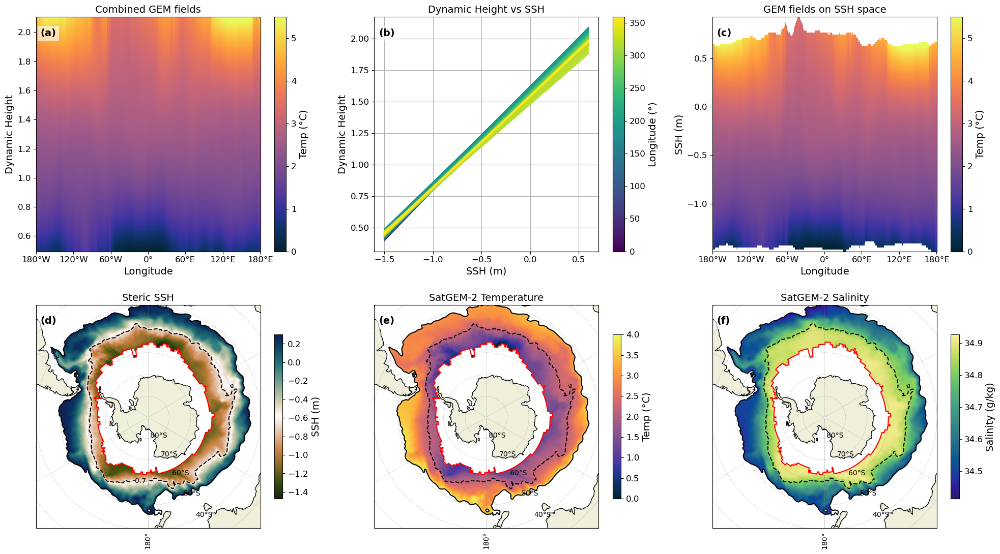

In [29]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.gridspec as gridspec
import numpy as np
import matplotlib.cm as cm
import cmocean

# ==========================================
# Global font configuration (recommended)
# ==========================================
plt.rcParams.update({
    'font.size': 14,
    'axes.titlesize': 16,
    'axes.labelsize': 14,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'legend.fontsize': 13,
    'figure.titlesize': 18
})


# SSH vs Dynamic Height prep
ssh_vals = np.linspace(-1.5, 0.6, 100)
sorted_lons = sorted(slopes_intercepts.keys())
cmap = cm.viridis
norm = plt.Normalize(min(sorted_lons), max(sorted_lons))

# New figure and updated layout
fig = plt.figure(figsize=(20, 12))  # Wider figure
gs = gridspec.GridSpec(3, 3, height_ratios=[1, 1, 0.05], width_ratios=[1, 1, 1])

xticks = np.arange(-180, 181, 60)
labels = [f"{abs(x)}°{'W' if x < 0 else ('E' if x > 0 else '')}" for x in xticks]

# --- Top-left: combined ---
ax1 = fig.add_subplot(gs[0, 0])
pc1 = ax1.pcolormesh(combined.longitude, combined.dyn_m, combined.T, shading='auto',
                     vmin=0, vmax=5.5, cmap=cmocean.cm.thermal)
ax1.set_title('Combined GEM fields', fontsize=14)
ax1.set_xlabel('Longitude')
ax1.set_ylabel('Dynamic Height')
ax1.set_xticks(xticks)
ax1.set_xticklabels(labels)
cb1 = fig.colorbar(pc1, ax=ax1, orientation='vertical', label='Temp (°C)')

# --- NEW subplot in center: Dynamic Height vs SSH ---
ax_mid = fig.add_subplot(gs[0, 1])
for lon in sorted_lons:
    slope, intercept = slopes_intercepts[lon]
    dyn_vals = slope * ssh_vals + intercept
    ax_mid.plot(ssh_vals, dyn_vals, color=cmap(norm(lon)), alpha=0.7)
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar_mid = plt.colorbar(sm, ax=ax_mid, label="Longitude (°)")
ax_mid.set_title("Dynamic Height vs SSH", fontsize=14)
ax_mid.set_xlabel("SSH (m)")
ax_mid.set_ylabel("Dynamic Height")
ax_mid.grid(True)

# --- Top-right: binned means ---
ax2 = fig.add_subplot(gs[0, 2])
pc2 = ax2.pcolormesh(binned_means_ds.longitude, binned_means_ds.ssh_bin,
                     binned_means_ds.binned_means.T, shading='auto',
                     vmin=0, vmax=5.5, cmap=cmocean.cm.thermal)

ax2.set_title('GEM fields on SSH space', fontsize=14)
ax2.set_xlabel('Longitude')
ax2.set_ylabel('SSH (m)')
ax2.set_xticks(xticks)
ax2.set_xticklabels(labels)
cb2 = fig.colorbar(pc2, ax=ax2, orientation='vertical', label='Temp (°C)')
# --- Bottom-left: raw satGEM ---
ax3 = fig.add_subplot(gs[1, 0], projection=ccrs.SouthPolarStereo())
temp_slice = satGEM_ts_field_ds_circumpolar.temp[:, :, 100]
lon = satGEM_ts_field_ds_circumpolar.longitude
lat = satGEM_ts_field_ds_circumpolar.latitude

pc3 = ax3.pcolormesh(lon, lat, ssh_circumpolar_mean.where(~area_mask),
             cmap=cmocean.cm.tarn, transform=ccrs.PlateCarree())
contour_masked = ax3.contour(lon, lat, ssh_circumpolar_mean, levels=[-0.65,0.3],
                             colors='black', linewidths=0.2, transform=ccrs.PlateCarree())

ax3.plot(longitude, sie_mask, 'r-', transform=ccrs.PlateCarree(), label='Sea Ice Edge')

# Add PF contours from ssh_circumpolar_mean
contour = ax3.contour(
    ssh_circumpolar_mean.longitude,
    ssh_circumpolar_mean.latitude,
    ssh_circumpolar_mean,
    levels=[-0.65, 0.3],
    colors='k',
    transform=ccrs.PlateCarree()
)
ax3.clabel(contour, inline=True, fontsize=10, fmt="%.1f")
ax3.set_title('Steric SSH', fontsize=14)
ax3.set_xlabel('Longitude')
ax3.set_ylabel('Latitude')
ax3.coastlines()
ax3.add_feature(cfeature.LAND)
ax3.set_extent([lon.min().item(), lon.max().item(), -70, -40], crs=ccrs.PlateCarree())
gl = ax3.gridlines(draw_labels=True, crs=ccrs.PlateCarree(), linewidth=0.5,
                   color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 10}
gl.ylabel_style = {'size': 10}
cb3= fig.colorbar(pc3, ax=ax3, orientation='vertical', label='SSH (m)', shrink=0.7)
# --- Bottom-right: smoothed satGEM ---
ax4 = fig.add_subplot(gs[1, 1], projection=ccrs.SouthPolarStereo())
temp_smooth_slice = satGEM_ts_field_ds_circumpolar.temp[:, :, 100]
# Add sea ice edge (red line)
ax4.plot(longitude, sie_mask, 'r-', transform=ccrs.PlateCarree(), label='Sea Ice Edge')

# Add PF contours from ssh_circumpolar_mean
contour = ax4.contour(
    ssh_circumpolar_mean.longitude,
    ssh_circumpolar_mean.latitude,
    ssh_circumpolar_mean,
    levels=[-0.65, 0.3],
    colors='k',
    transform=ccrs.PlateCarree()
)
pc4 = ax4.pcolormesh(lon, lat, temp_smooth_slice.where(~area_mask), shading='auto', vmin=0, vmax=4,
                     cmap=cmocean.cm.thermal, transform=ccrs.PlateCarree())
ax4.set_title('SatGEM-2 Temperature', fontsize=14)
ax4.set_xlabel('Longitude')
ax4.set_ylabel('Latitude')
ax4.coastlines()
ax4.add_feature(cfeature.LAND)
ax4.set_extent([lon.min().item(), lon.max().item(), -70, -40], crs=ccrs.PlateCarree())
gl = ax4.gridlines(draw_labels=True, crs=ccrs.PlateCarree(), linewidth=0.5,
                   color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 10}
gl.ylabel_style = {'size': 10}

cb4 = fig.colorbar(pc4, ax=ax4, orientation='vertical', label='Temp (°C)', shrink=0.7)



# --- Bottom-right: smoothed satGEM ---
ax5 = fig.add_subplot(gs[1, 2], projection=ccrs.SouthPolarStereo())
temp_smooth_slice = satGEM_ts_field_ds_circumpolar.sal[:, :, 100]
# Add sea ice edge (red line)
ax5.plot(longitude, sie_mask, 'r-', transform=ccrs.PlateCarree(), label='Sea Ice Edge')

# Add PF contours from ssh_circumpolar_mean
contour = ax5.contour(
    ssh_circumpolar_mean.longitude,
    ssh_circumpolar_mean.latitude,
    ssh_circumpolar_mean,
    levels=[-0.65, 0.3],
    colors='k',
    transform=ccrs.PlateCarree()
)
pc5 = ax5.pcolormesh(lon, lat, temp_smooth_slice.where(~area_mask), shading='auto', 
                     cmap=cmocean.cm.haline, transform=ccrs.PlateCarree())
ax5.set_title('SatGEM-2 Salinity', fontsize=14)
ax5.set_xlabel('Longitude')
ax5.set_ylabel('Latitude')
ax5.coastlines()
ax5.add_feature(cfeature.LAND)
ax5.set_extent([lon.min().item(), lon.max().item(), -70, -40], crs=ccrs.PlateCarree())
gl = ax5.gridlines(draw_labels=True, crs=ccrs.PlateCarree(), linewidth=0.5,
                   color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 10}
gl.ylabel_style = {'size': 10}

cb5 = fig.colorbar(pc5, ax=ax5, orientation='vertical', label='Salinity (g/kg)', shrink=0.7)

# TEXT LABELS #
# Add subplot labels (a, b, c, ...)
labels = ['(a)', '(b)', '(c)', '(d)', '(e)', '(f)']
axes = [ax1, ax_mid, ax2, ax3, ax4, ax5]
for label, ax in zip(labels, axes):
    # Position labels in the top-left with some padding
    ax.text(0.02, 0.95, label, transform=ax.transAxes,
            fontsize=14, fontweight='bold', va='top', ha='left',
            bbox=dict(facecolor='white', edgecolor='none', alpha=0.6))


# # --- Shared colorbar at the bottom ---
# cax = fig.add_subplot(gs[2, :])
# cbar = fig.colorbar(pc4, cax=cax, orientation='horizontal')
# cbar.set_label('Temperature (°C)', fontsize=14)

plt.tight_layout()
plt.subplots_adjust(hspace=0.3)

for cb in [cb1, cb2, cb3, cb4, cb5]:
    cb.ax.tick_params(labelsize=12)     # tick label size
    cb.set_label(cb.ax.get_ylabel(), fontsize=14)


plt.show()


# Figure 4: Residuals

In [42]:
sal_combined_data_regridded = xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/sal_combined_data_regridded.nc').salinity_trends
temp_combined_data_regridded= xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/temp_combined_data_regridded.nc').temp_trends
combined_sal_trend= xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/combined_sal_trend.nc').__xarray_dataarray_variable__
combined_temp_trend= xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/combined_temp_trend.nc').temp_trends
frontal_shift_s_trend= xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/frontal_shift_s_trend.nc').sal_trends
frontal_shift_t_trend= xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/frontal_shift_t_trend.nc').temp_trends
gamma_mean= xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/gamma_mean.nc').gamma_n

/jobfs/154533434.gadi-pbs/ipykernel_1412859/2721403841.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.1, 1, 1])


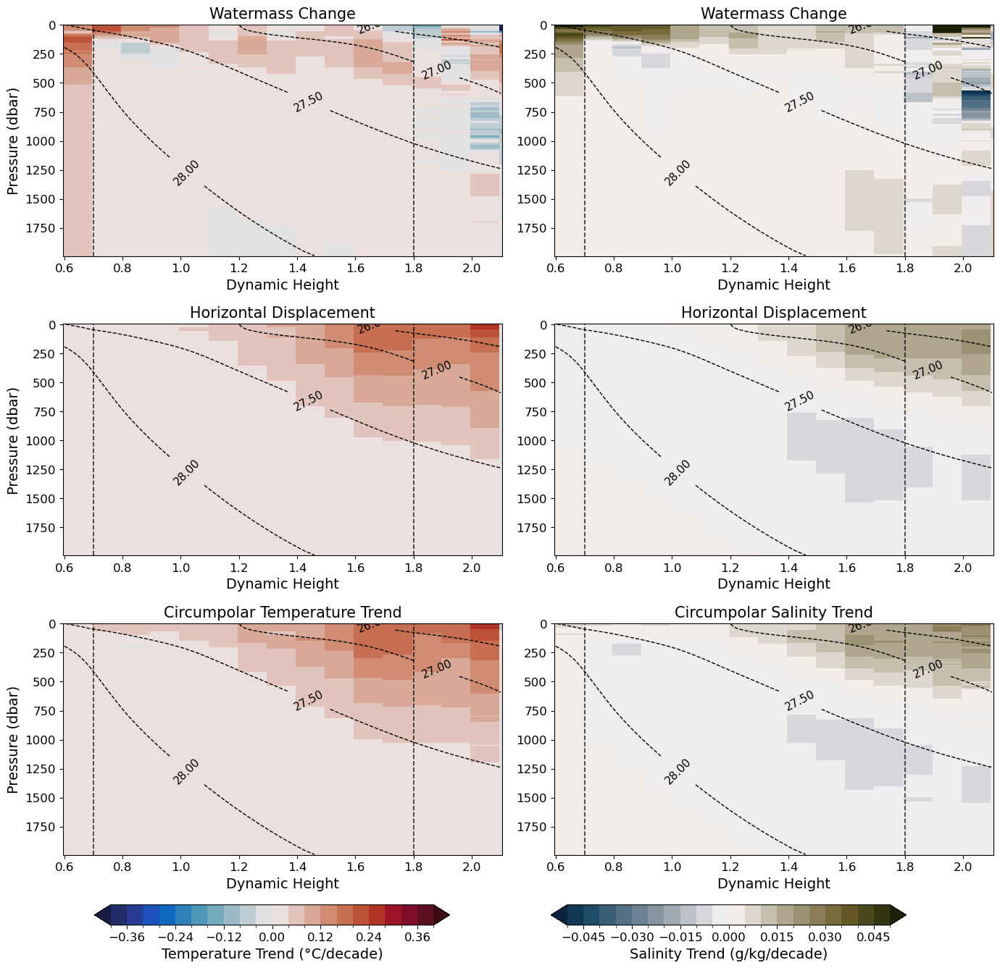

In [43]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import BoundaryNorm
import cmocean

# --- styling: larger fonts everywhere ---
plt.rcParams.update({
    "font.size": 13,          # base
    "axes.titlesize": 15,
    "axes.labelsize": 14,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
    "legend.fontsize": 12
})

# Define levels and norms
sal_levels = np.arange(-0.05, 0.055, 0.005)
sal_norm = BoundaryNorm(sal_levels, ncolors=256, extend="both")

temp_levels = np.arange(-0.4, 0.44, 0.04)
temp_norm = BoundaryNorm(temp_levels, ncolors=256, extend="both")

# Requested density contour levels
gamma_levels_to_plot = [26.6, 27.0, 27.5, 28.0, 28.27]

def plot_subplot(ax, data, dyn_m, pressure, cmap, norm, contour_data=None, factor=1):
    # main field
    mesh = ax.pcolormesh(dyn_m, pressure, data * factor, cmap=cmap, norm=norm, shading="auto")

    # density contours (on requested levels only)
    if contour_data is not None:
        gamma_contours = ax.contour(
            contour_data.dyn_m[10:], 
            contour_data.pressure[0:200], 
            contour_data[10:, 0:200].T,
            levels=gamma_levels_to_plot,
            colors='k',
            linestyles='--',
            linewidths=1.0
        )
        ax.clabel(gamma_contours, inline=True, fontsize=11, fmt="%.2f")

    # requested vertical dashed lines at dyn_m = 0.7 and 1.8
    ax.axvline(0.7, linestyle="--", linewidth=1.2, color="k", alpha=0.8, zorder=5)
    ax.axvline(1.8, linestyle="--", linewidth=1.2, color="k", alpha=0.8, zorder=5)

    ax.invert_yaxis()
    ax.set_xlabel("Dynamic Height")
    return mesh
    
# Create figure and axes
fig, axes = plt.subplots(3, 2, figsize=(14, 14))

# Temperature plots (left column)
temp_meshes = [
    plot_subplot(
        axes[0, 0],
        temp_combined_data_regridded.T,
        temp_combined_data_regridded.dyn_m,
        temp_combined_data_regridded.pressure,
        cmocean.cm.balance, temp_norm, gamma_mean, 
    ),
    plot_subplot(
        axes[1, 0],
        frontal_shift_t_trend.T,
        frontal_shift_t_trend.dyn_m,
        frontal_shift_t_trend.pressure,
        cmocean.cm.balance, temp_norm, gamma_mean
    ),
    plot_subplot(
        axes[2, 0],
        combined_temp_trend.T,
        combined_temp_trend.dyn_m,
        combined_temp_trend.pressure,
        cmocean.cm.balance, temp_norm, gamma_mean
    )
]

# Salinity plots (right column)
sal_meshes = [
    plot_subplot(
        axes[0, 1],
        sal_combined_data_regridded.T,
        sal_combined_data_regridded.dyn_m,
        sal_combined_data_regridded.pressure,
        cmocean.cm.diff, sal_norm, gamma_mean, 
    ),
    plot_subplot(
        axes[1, 1],
        frontal_shift_s_trend.T,
        frontal_shift_s_trend.dyn_m,
        frontal_shift_s_trend.pressure,
        cmocean.cm.diff, sal_norm, gamma_mean
    ),
    plot_subplot(
        axes[2, 1],
        combined_sal_trend.T,
        combined_sal_trend.dyn_m,
        combined_sal_trend.pressure,
        cmocean.cm.diff, sal_norm, gamma_mean
    )
]

# Set titles and labels (bigger titles + y-labels already sized via rcParams)
for ax, title in zip(axes[:, 0], ["Watermass Change", "Horizontal Displacement",
                                  "Circumpolar Temperature Trend"]):
    ax.set_title(title)
    ax.set_ylabel("Pressure (dbar)")

for ax, title in zip(axes[:, 1], ["Watermass Change", "Horizontal Displacement",
                                  "Circumpolar Salinity Trend"]):
    ax.set_title(title)

# Add shared colorbars with larger labels/ticks
cbar_ax_temp = fig.add_axes([0.1, 0.08, 0.35, 0.02])
cbar_ax_sal  = fig.add_axes([0.55, 0.08, 0.35, 0.02])

cb_t = fig.colorbar(
    temp_meshes[0],
    cax=cbar_ax_temp,
    orientation='horizontal',
    label="Temperature Trend (\u00b0C/decade)"
)
cb_s = fig.colorbar(
    sal_meshes[0],
    cax=cbar_ax_sal,
    orientation='horizontal',
    label="Salinity Trend (g/kg/decade)"
)
cb_t.ax.tick_params(labelsize=12)
cb_s.ax.tick_params(labelsize=12)

# Adjust layout
plt.tight_layout(rect=[0, 0.1, 1, 1])
# save_path = "/g/data/jk72/jw2777/Paper_2_figs/top_2000/residuals_v3.png"
# plt.savefig(save_path, dpi=300, bbox_inches='tight')

plt.show()


# Figure 5: Horizontal transects

In [44]:
temp  = xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/satGEM_2004_01.nc').temp
sal  = xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/satGEM_2004_01.nc').sal
gamma_n =  xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/satGEM_gamma_2004_01.nc').gamma_n


In [45]:
etopo = xr.open_dataset(
    "/g/data/jk72/jw2777/from_v45/jw2777/Data/ETOPO1_Bed_c_gmt4.grd"
).sel(y=slice(-80, -30))

etopo = etopo.assign_coords(
    x=((etopo.x + 360) % 360)
).sortby('x')

atl_temp = temp.sel(longitude=345,method='nearest')[:160]
atl_sal = sal.sel(longitude=345,method='nearest')[:160]
atl_gamma = gamma_n.sel(longitude=345,method='nearest')[:160]

etopo_atl = etopo.sel(x=atl_temp.longitude,y=atl_temp.latitude,method='nearest')

atl_temp = atl_temp.where(
            atl_temp.pressure <= -1 * etopo_atl.z, np.nan)
atl_sal = atl_sal.where(
            atl_sal.pressure <= -1 * etopo_atl.z, np.nan)
atl_gamma = atl_gamma.where(
            atl_gamma.pressure <= -1 * etopo_atl.z, np.nan)

ind_temp = temp.sel(longitude=100,method='nearest')[:160]
ind_sal = sal.sel(longitude=100,method='nearest')[:160]
ind_gamma = gamma_n.sel(longitude=100,method='nearest')[:160]
etopo_ind = etopo.sel(x=ind_temp.longitude,y=ind_temp.latitude,method='nearest')

ind_temp = ind_temp.where(
            ind_temp.pressure <= -1 * etopo_ind.z, np.nan)
ind_sal = ind_sal.where(
            ind_sal.pressure <= -1 * etopo_ind.z, np.nan)
ind_gamma = ind_gamma.where(
            ind_gamma.pressure <= -1 * etopo_ind.z, np.nan)

pac_temp = temp.sel(longitude=255,method='nearest')[:160]
pac_sal = sal.sel(longitude=255,method='nearest')[:160]
pac_gamma = gamma_n.sel(longitude=255,method='nearest')[:160]
etopo_pac= etopo.sel(x=pac_temp.longitude,y=pac_temp.latitude,method='nearest')

pac_temp = pac_temp.where(
            pac_temp.pressure <= -1 * etopo_pac.z, np.nan)
pac_sal = pac_sal.where(
            pac_sal.pressure <= -1 * etopo_pac.z, np.nan)
pac_gamma = pac_gamma.where(
            pac_gamma.pressure <= -1 * etopo_pac.z, np.nan)

/jobfs/154533434.gadi-pbs/ipykernel_1412859/1033270518.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.12, 1, 1])  # leave room for legend


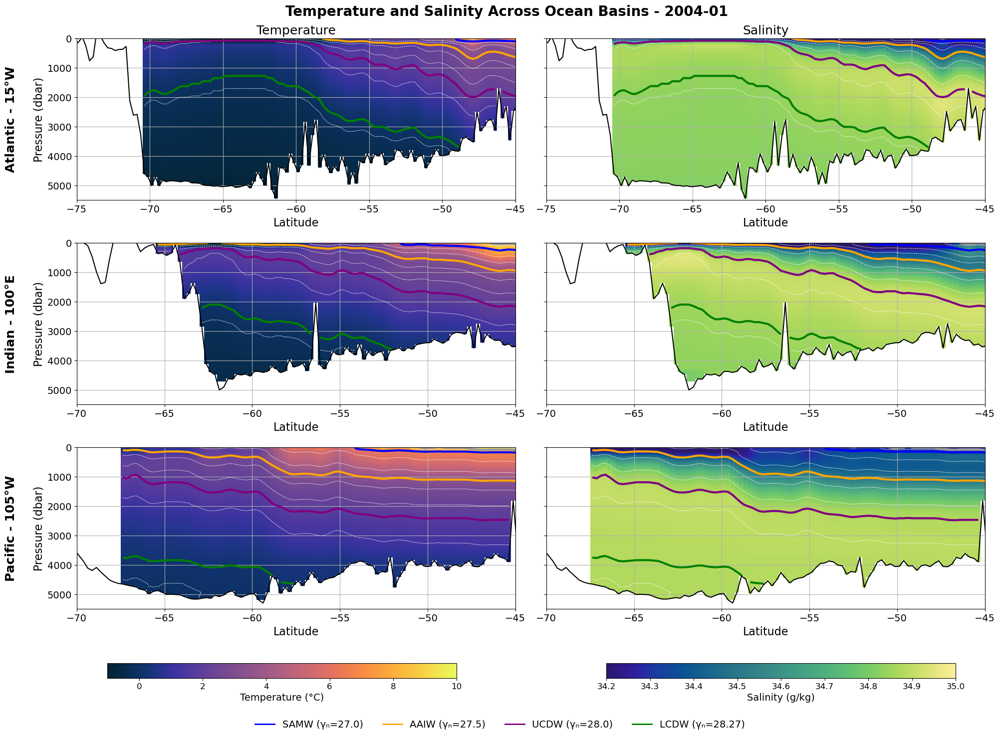

In [46]:
import matplotlib.pyplot as plt
import cmocean
import numpy as np
from matplotlib.lines import Line2D

plt.rcParams.update({"font.size": 14})

# ---------------- Config ----------------
temp_vmin, temp_vmax = -1, 10
sal_vmin, sal_vmax   = 34.2, 35.0

bg_levels  = np.linspace(26.5, 28.5, 11)          # faint γ_n background
wm_bounds  = [26.6, 26.90, 27.5, 28.0, 28.27]      # draw all interfaces
wm_colors  = {                                     # color the main interfaces
    26.9:  "blue",    # SAMW
    27.5:  "orange",  # AAIW
    28.0:  "purple",  # UCDW
    28.27: "green"    # LCDW
}
aux_color = "0.6"   # gray for 26.6 (not in legend)
lcdw_level = 28.27
lcdw_min_pressure = 1000  # dbar cutoff for TOP ROW only

fig, axs = plt.subplots(3, 2, figsize=(20, 15), sharey=True)
regions = ['Atlantic - 15°W', 'Indian - 100°E', 'Pacific - 105°W']
datasets = [
    (atl_temp, atl_sal, atl_gamma, etopo_atl),
    (ind_temp, ind_sal, ind_gamma, etopo_ind),
    (pac_temp, pac_sal, pac_gamma, etopo_pac),
]
xlims = [(-75, -45), (-70, -45), (-70, -45)]

temp_plots, sal_plots = [], []

# ---------------- Plot ----------------
for i, (temp_data, sal_data, gamma_data, topo_data) in enumerate(datasets):
    # -------- Temperature panel --------
    tp = axs[i, 0].pcolormesh(
        temp_data.latitude, temp_data.pressure, temp_data.T,
        shading='nearest', cmap=cmocean.cm.thermal,
        vmin=temp_vmin, vmax=temp_vmax
    )
    temp_plots.append(tp)

    # Faint background γ_n contours
    axs[i, 0].contour(
        gamma_data.latitude, gamma_data.pressure, gamma_data.T,
        levels=bg_levels, colors='white', linestyles='--', linewidths=0.6
    )

    # Colored interface lines
    for lvl in wm_bounds:
        color = wm_colors.get(lvl, aux_color)
        if (i == 0) and (lvl == lcdw_level):
            # Top row only: mask LCDW above cutoff so only deepest occurrence is drawn
            masked = gamma_data.T.where(gamma_data.pressure > lcdw_min_pressure)
            axs[i, 0].contour(
                gamma_data.latitude, gamma_data.pressure, masked,
                levels=[lvl], colors=color, linewidths=3.0
            )
        else:
            axs[i, 0].contour(
                gamma_data.latitude, gamma_data.pressure, gamma_data.T,
                levels=[lvl], colors=color, linewidths=3.0
            )

    # Bathymetry
    axs[i, 0].plot(topo_data.y, -topo_data.z, color='black')

    # Axes styling
    axs[i, 0].set_xlim(xlims[i]); axs[i, 0].set_ylim(0, 5500); axs[i, 0].invert_yaxis()
    axs[i, 0].set_ylabel('Pressure (dbar)', fontsize=16)
    axs[i, 0].set_xlabel('Latitude', fontsize=16)
    axs[i, 0].grid(); axs[i, 0].tick_params(axis='both', which='major', labelsize=14)

    # -------- Salinity panel --------
    sp = axs[i, 1].pcolormesh(
        sal_data.latitude, sal_data.pressure, sal_data.T,  # change to sal_data.S if your sal var is 'S'
        shading='nearest', cmap=cmocean.cm.haline,
        vmin=sal_vmin, vmax=sal_vmax
    )
    sal_plots.append(sp)

    axs[i, 1].contour(
        gamma_data.latitude, gamma_data.pressure, gamma_data.T,
        levels=bg_levels, colors='white', linestyles='--', linewidths=0.6
    )

    for lvl in wm_bounds:
        color = wm_colors.get(lvl, aux_color)
        if (i == 0) and (lvl == lcdw_level):
            masked = gamma_data.T.where(gamma_data.pressure > lcdw_min_pressure)
            axs[i, 1].contour(
                gamma_data.latitude, gamma_data.pressure, masked,
                levels=[lvl], colors=color, linewidths=3.0
            )
        else:
            axs[i, 1].contour(
                gamma_data.latitude, gamma_data.pressure, gamma_data.T,
                levels=[lvl], colors=color, linewidths=3.0
            )

    axs[i, 1].plot(topo_data.y, -topo_data.z, color='black')
    axs[i, 1].set_xlim(xlims[i]); axs[i, 1].set_ylim(0, 5500); axs[i, 1].invert_yaxis()
    axs[i, 1].set_xlabel('Latitude', fontsize=16)
    axs[i, 1].grid(); axs[i, 1].tick_params(axis='both', which='major', labelsize=14)

    if i == 0:
        axs[i, 0].set_title('Temperature', fontsize=18)
        axs[i, 1].set_title('Salinity', fontsize=18)

    axs[i, 0].text(
        -0.15, 0.5, regions[i], transform=axs[i, 0].transAxes,
        rotation=90, fontsize=18, va='center', ha='center', weight='bold'
    )

# ---------------- Colorbars & Legend ----------------
cbar_ax_temp = fig.add_axes([0.1, 0.08, 0.35, 0.02])
cbar_ax_sal  = fig.add_axes([0.60, 0.08, 0.35, 0.02])
fig.colorbar(temp_plots[0], cax=cbar_ax_temp, orientation='horizontal', label="Temperature (°C)")
fig.colorbar(sal_plots[0],  cax=cbar_ax_sal,  orientation='horizontal', label="Salinity (g/kg)")

legend_lines = [
    Line2D([0], [0], color="blue",   lw=2),
    Line2D([0], [0], color="orange", lw=2),
    Line2D([0], [0], color="purple", lw=2),
    Line2D([0], [0], color="green",  lw=2),
]
legend_labels = ["SAMW (γₙ=27.0)", "AAIW (γₙ=27.5)", "UCDW (γₙ=28.0)", "LCDW (γₙ=28.27)"]
fig.legend(legend_lines, legend_labels, loc='lower center', ncol=4, fontsize=14, frameon=False)

plt.suptitle('Temperature and Salinity Across Ocean Basins - 2004-01',
             fontsize=20, weight='bold')
plt.tight_layout(rect=[0, 0.12, 1, 1])  # leave room for legend

# save_path = "/g/data/jk72/jw2777/Paper_2_figs/top_2000/transects.png"
# plt.savefig(save_path, dpi=300, bbox_inches='tight')

plt.show()


# Figure 6: Pressure slices 

In [127]:
temp  = xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/satGEM_2004_01.nc').temp
sal  = xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/satGEM_2004_01.nc').sal
gamma_n =  xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/satGEM_gamma_2004_01.nc').gamma_n

etopo = xr.open_dataset(
    "/g/data/jk72/jw2777/from_v45/jw2777/Data/ETOPO1_Bed_c_gmt4.grd"
).sel(y=slice(-80, -30))

etopo = etopo.assign_coords(
    x=((etopo.x + 360) % 360)
).sortby('x')

etopo = etopo.sel(x=sal.longitude,y=sal.latitude,method='nearest')

temp = temp.where(
            temp.pressure <= -1 * etopo.z, np.nan)

sal = sal.where(
            sal.pressure <= -1 * etopo.z, np.nan)

gamma_n = gamma_n.where(
            gamma_n.pressure <= -1 * etopo.z, np.nan)

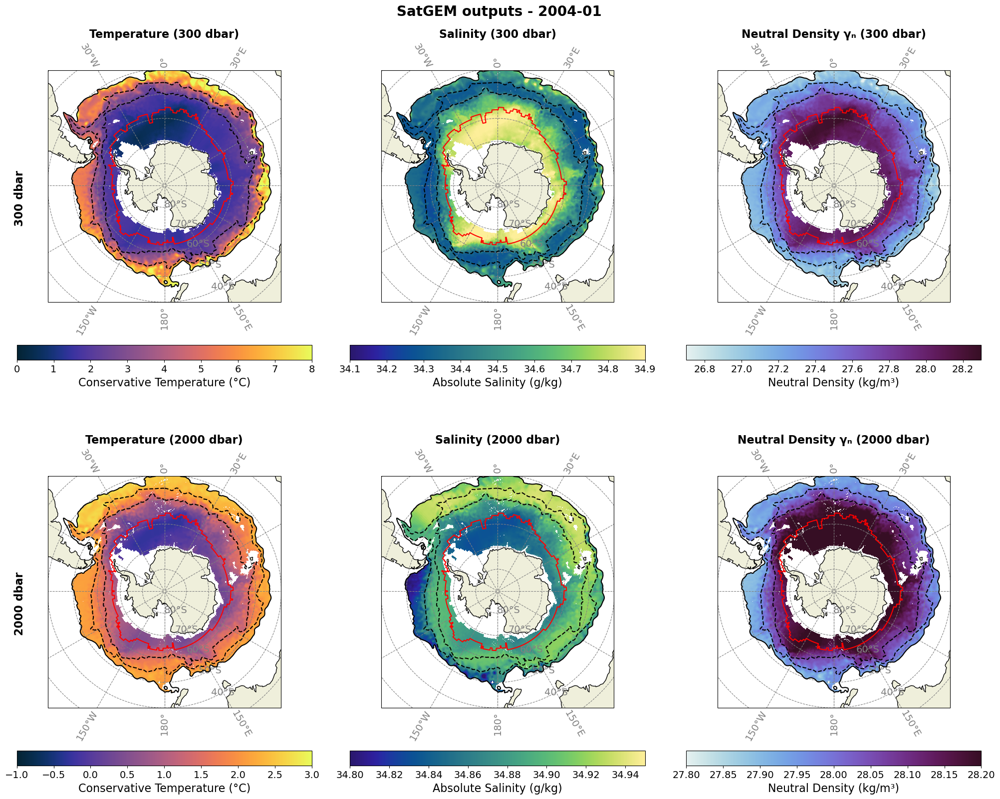

In [128]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cmocean

# --------------------------
# GLOBAL STYLING (readable)
# --------------------------
plt.rcParams.update({"font.size": 14})

# ==========================
# 1) PREP SSH + SEA-ICE EDGE
# ==========================
# Close the seam at 0/360 so the polar projection doesn’t show a gap
data_at_0_125 = ssh_circumpolar_mean.sel(longitude=0.125)
data_at_360_125 = data_at_0_125.assign_coords(longitude=360.125)
ssh_with_360_125 = xr.concat([ssh_circumpolar_mean, data_at_360_125], dim="longitude").sortby("longitude")

longitude = ssh_with_360_125.longitude.values
latitude  = ssh_with_360_125.latitude.values
SSH       = ssh_with_360_125  # 2D: lat x lon (xarray DataArray)

# Build sea-ice edge (southernmost latitude where SSH <= 0.3 at each longitude),
# with a gap check to avoid jumping across large holes northward.
sie_mask = np.full(longitude.shape, np.nan)
gap_threshold = 10  # number of grid cells considered a big northern gap

for i, lon in enumerate(longitude):
    col = SSH[:, i].values
    valid = np.isfinite(col)
    if not np.any(valid):
        continue

    below = (col <= 0.3) & valid
    idxs  = np.where(below)[0]
    if len(idxs) == 0:
        continue

    southernmost = idxs[0]
    sie_mask[i]  = latitude[southernmost]

    # Optional gap protection northward of the edge
    north = col[southernmost + 1:]
    above = north > 0.3
    gap_len = 0
    for j, v in enumerate(above):
        if v:
            gap_len += 1
        else:
            if gap_len >= gap_threshold:
                cutoff = southernmost + 1 + j
                col[cutoff:] = np.nan
                break
            gap_len = 0
    col[col > 0.3] = np.nan  # keep only south of 0.3
    SSH[:, i] = col

# Boolean mask that is True where we want to hide data (north of 0.3)
mask_north = ssh_circumpolar_mean > 0.3

# ==========================
# 2) MAKE MASKED FIELDS
# ==========================
# Helper: mask a (lat,lon) 2D slice to keep only south of 0.3 m SSH
def south_of_0p3(da_2d):
    # da_2d should broadcast with mask_north; it’s safest if it’s an xarray DataArray
    return xr.where(mask_north[:,:], np.nan, da_2d)

# Pressure indices you used (depth slices)
k300  = 30   # ~300 dbar
k2000 = 195  # ~2000 dbar

# Mask each plotted field
temp_300_masked  = south_of_0p3(temp.isel(pressure=k300))
sal_300_masked   = south_of_0p3(sal.isel(pressure=k300))
gamma_300_masked = south_of_0p3(gamma_n.isel(pressure=k300))

temp_2000_masked  = south_of_0p3(temp.isel(pressure=k2000))
sal_2000_masked   = south_of_0p3(sal.isel(pressure=k2000))
gamma_2000_masked = south_of_0p3(gamma_n.isel(pressure=k2000))

# ==========================
# 3) PLOTTING
# ==========================
# --- replace your fig creation line with this ---
fig, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(
    2, 3, figsize=(20, 16),
    subplot_kw={'projection': ccrs.SouthPolarStereo()},
    constrained_layout=True  # <— key: let Matplotlib manage spacing
)

# Right after creating fig, add a bit more global breathing room:
fig.set_constrained_layout_pads(w_pad=0.06, h_pad=0.10, wspace=0.05, hspace=0.12)


def style_ax(ax, lat_min=-80, lat_max=-40, title=None):
    ax.coastlines()
    ax.add_feature(cfeature.LAND)
    ax.set_extent([-180, 180, lat_min, lat_max], crs=ccrs.PlateCarree())
    gl = ax.gridlines(draw_labels=True, xlocs=range(-180, 181, 30), linestyle='--', color='gray')
    gl.top_labels = True; gl.bottom_labels = True
    gl.right_labels = True; gl.left_labels = True
    gl.xlabel_style = {'size': 14, 'color': 'gray'}
    gl.ylabel_style = {'size': 14, 'color': 'gray'}
    if title:
        ax.set_title(title, fontsize=16, weight='bold')

# --- Row 1: ~300 dbar ---
style_ax(ax1, -80, -40, "Temperature (300 dbar)")
im1 = ax1.pcolormesh(temp.longitude, temp.latitude, temp_300_masked,
                     shading='nearest', vmin=0, vmax=8,
                     cmap=cmocean.cm.thermal, transform=ccrs.PlateCarree())
cb1 = plt.colorbar(im1, ax=ax1, orientation='horizontal', pad=0.03)
cb1.set_label('Conservative Temperature (°C)', fontsize=16)
cb1.ax.tick_params(labelsize=14)

style_ax(ax2, -80, -40, "Salinity (300 dbar)")
im2 = ax2.pcolormesh(sal.longitude, sal.latitude, sal_300_masked,
                     shading='nearest', vmin=34.1, vmax=34.9,
                     cmap=cmocean.cm.haline, transform=ccrs.PlateCarree())
cb2 = plt.colorbar(im2, ax=ax2, orientation='horizontal', pad=0.03)
cb2.set_label('Absolute Salinity (g/kg)', fontsize=16)
cb2.ax.tick_params(labelsize=14)

style_ax(ax3, -80, -40, "Neutral Density γₙ (300 dbar)")
im3 = ax3.pcolormesh(gamma_n.longitude, gamma_n.latitude, gamma_300_masked,
                     shading='nearest', vmin=26.7, vmax=28.3,
                     cmap=cmocean.cm.dense, transform=ccrs.PlateCarree())
cb3 = plt.colorbar(im3, ax=ax3, orientation='horizontal', pad=0.03)
cb3.set_label('Neutral Density (kg/m³)', fontsize=16)
cb3.ax.tick_params(labelsize=14)

# --- Row 2: ~2000 dbar ---
style_ax(ax4, -90, -40, "Temperature (2000 dbar)")
im4 = ax4.pcolormesh(temp.longitude, temp.latitude, temp_2000_masked,
                     shading='nearest', vmin=-1, vmax=3,
                     cmap=cmocean.cm.thermal, transform=ccrs.PlateCarree())
cb4 = plt.colorbar(im4, ax=ax4, orientation='horizontal', pad=0.03)
cb4.set_label('Conservative Temperature (°C)', fontsize=16)
cb4.ax.tick_params(labelsize=14)

style_ax(ax5, -80, -40, "Salinity (2000 dbar)")
im5 = ax5.pcolormesh(sal.longitude, sal.latitude, sal_2000_masked,
                     shading='nearest', vmin=34.8, vmax=34.95,
                     cmap=cmocean.cm.haline, transform=ccrs.PlateCarree())
cb5 = plt.colorbar(im5, ax=ax5, orientation='horizontal', pad=0.03)
cb5.set_label('Absolute Salinity (g/kg)', fontsize=16)
cb5.ax.tick_params(labelsize=14)

style_ax(ax6, -80, -40, "Neutral Density γₙ (2000 dbar)")
im6 = ax6.pcolormesh(gamma_n.longitude, gamma_n.latitude, gamma_2000_masked,
                     shading='nearest', vmin=27.8, vmax=28.2,
                     cmap=cmocean.cm.dense, transform=ccrs.PlateCarree())
cb6 = plt.colorbar(im6, ax=ax6, orientation='horizontal', pad=0.03)
cb6.set_label('Neutral Density (kg/m³)', fontsize=16)
cb6.ax.tick_params(labelsize=14)

# --- Overlays common to all subplots: sea-ice edge (red) and PF contour (-0.65, black) ---
axes_all = [ax1, ax2, ax3, ax4, ax5, ax6]
for ax in axes_all:
    # Sea-ice edge (SIE) as a red line
    ax.plot(longitude, sie_mask, 'r-', transform=ccrs.PlateCarree(), label='Sea-ice edge')

    # PF-like SSH contour at -0.65 m
    ax.contour(ssh_circumpolar_mean.longitude,
               ssh_circumpolar_mean.latitude,
               ssh_circumpolar_mean,
               levels=[-0.65, -0.1, 0.3], colors='k', linewidths=1.5,
               transform=ccrs.PlateCarree())

# Row labels on the left margin
ax1.text(-0.12, 0.45, '300 dbar', transform=ax1.transAxes,
         rotation=90, fontsize=16, va='center', ha='center', weight='bold')
ax4.text(-0.12, 0.45, '2000 dbar', transform=ax4.transAxes,
         rotation=90, fontsize=16, va='center', ha='center', weight='bold')

plt.suptitle('SatGEM outputs - 2004-01', fontsize=20, weight='bold')
# plt.tight_layout()


plt.show()


# Figure 7: On density

In [59]:
temp_on_gamma = xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/temp_on_gamma.nc').__xarray_dataarray_variable__

In [60]:
sal_on_gamma= xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/sal_on_gamma.nc').__xarray_dataarray_variable__

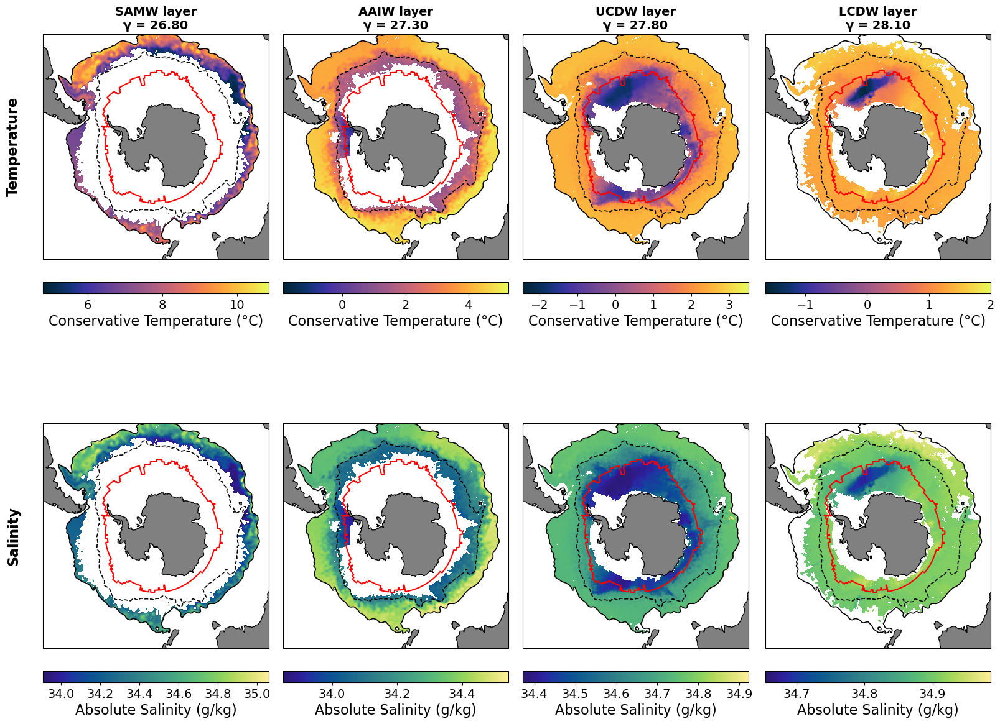

In [61]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cmocean

# --------------------------
# GLOBAL STYLING
# --------------------------
plt.rcParams.update({"font.size": 14})

# ==========================
# 1) PREP SSH + SEA-ICE EDGE
# ==========================
# Close the 0/360 seam to avoid a gap in polar projection
data_at_0_125  = ssh_circumpolar_mean.sel(longitude=0.125)
data_at_360_125 = data_at_0_125.assign_coords(longitude=360.125)
ssh_with_360_125 = xr.concat([ssh_circumpolar_mean, data_at_360_125], dim="longitude").sortby("longitude")

longitude = ssh_with_360_125.longitude.values
latitude  = ssh_with_360_125.latitude.values
SSH       = ssh_with_360_125.copy()  # lat x lon

# Build sea-ice edge (southernmost latitude where SSH <= 0.3 at each longitude)
sie_mask = np.full(longitude.shape, np.nan)
gap_threshold = 10  # cells

for i in range(len(longitude)):
    col = SSH[:, i].values
    valid = np.isfinite(col)
    if not np.any(valid):
        continue
    below = (col <= 0.3) & valid
    idxs = np.where(below)[0]
    if len(idxs) == 0:
        continue

    southernmost = idxs[0]
    sie_mask[i] = latitude[southernmost]

    # Optional northward gap-protection
    north = col[southernmost + 1:]
    above = north > 0.3
    gap_len = 0
    for j, v in enumerate(above):
        if v:
            gap_len += 1
        else:
            if gap_len >= gap_threshold:
                cutoff = southernmost + 1 + j
                col[cutoff:] = np.nan
                break
            gap_len = 0

    col[col > 0.3] = np.nan
    SSH[:, i] = col

# Mask to hide north of 0.3 m
mask_north = ssh_with_360_125 > 0.3  # True where we hide

def south_of_0p3_on_ssh_grid(da_2d):
    """
    Interp a (lat,lon) field onto SSH grid and mask north of 0.3m.
    """
    # Align to SSH grid if needed
    if not (np.array_equal(da_2d.latitude.values, ssh_with_360_125.latitude.values) and
            np.array_equal(da_2d.longitude.values, ssh_with_360_125.longitude.values)):
        da_2d = da_2d.interp(
            latitude=ssh_with_360_125.latitude,
            longitude=ssh_with_360_125.longitude,
            method="nearest"
        )
    return xr.where(mask_north, np.nan, da_2d)

# ==========================
# 2) SELECT γₙ LAYERS + MASK
# ==========================
gamma_levels_to_plot = [26.80, 27.30, 27.80, 28.10]
temp_sel = temp_on_gamma.sel(gamma_n=gamma_levels_to_plot, method='nearest')
sal_sel  = sal_on_gamma.sel(gamma_n=gamma_levels_to_plot, method='nearest')

# Precompute masked slices on SSH grid
temp_masked = {g: south_of_0p3_on_ssh_grid(temp_sel.sel(gamma_n=g, method='nearest')) for g in gamma_levels_to_plot}
sal_masked  = {g: south_of_0p3_on_ssh_grid(sal_sel.sel(gamma_n=g, method='nearest'))  for g in gamma_levels_to_plot}

# Optional per-layer vmin/vmax
def temp_limits(g):
    return (-0.5, 0.5) if np.isclose(g, 28.30) else (None, None)

def sal_limits(g):
    return (34.8, 34.95) if np.isclose(g, 28.30) else (None, None)

layer_names = ["SAMW layer", "AAIW layer", "UCDW layer", "LCDW layer"]

# ==========================
# 3) PLOTTING
# ==========================
proj = ccrs.SouthPolarStereo()
data_crs = ccrs.PlateCarree()

fig, axs = plt.subplots(
    nrows=2, ncols=len(gamma_levels_to_plot),
    figsize=(4 * len(gamma_levels_to_plot), 12),
    subplot_kw={'projection': proj},
    constrained_layout=True
)
# Give a bit more room between axes
fig.set_constrained_layout_pads(w_pad=0.06, h_pad=0.10, wspace=0.05, hspace=0.12)

for idx, g in enumerate(gamma_levels_to_plot):
    # -------- Temperature panel --------
    ax = axs[0, idx]
    ax.coastlines()
    ax.add_feature(cfeature.LAND, facecolor='gray')
    ax.set_extent([-180, 180, -80, -40], crs=data_crs)

    tmin, tmax = temp_limits(g)
    imT = ax.pcolormesh(
        temp_masked[g].longitude, temp_masked[g].latitude, temp_masked[g],
        vmin=tmin, vmax=tmax, transform=data_crs, cmap=cmocean.cm.thermal, shading="nearest"
    )
    cbt = plt.colorbar(imT, ax=ax, orientation='horizontal', pad=0.07)
    cbt.set_label('Conservative Temperature (°C)', fontsize=16)
    cbt.ax.tick_params(labelsize=14)

    # Column title (top row)
    ax.set_title(f"{layer_names[idx]}\nγ = {g:.2f}", fontsize=14, weight='bold')

    # Mask hatch overlay if you still want it (optional)
    if 'masked_overlay' in globals():
        ax.contourf(
            masked_overlay.longitude, masked_overlay.latitude, masked_overlay,
            levels=[0.5, 1.5], hatches=['////'], colors='none', transform=data_crs
        )

    # PF and 0.3 m SSH contours for reference
    ax.contour(
        ssh_circumpolar_mean.longitude, ssh_circumpolar_mean.latitude, ssh_circumpolar_mean,
        levels=[-0.65, 0.3], colors='k', linewidths=1.2, transform=data_crs
    )
    # Sea-ice edge
    ax.plot(longitude, sie_mask, 'r-', transform=data_crs, label='Sea-ice edge')

    # -------- Salinity panel --------
    ax = axs[1, idx]
    ax.coastlines()
    ax.add_feature(cfeature.LAND, facecolor='gray')
    ax.set_extent([-180, 180, -80, -40], crs=data_crs)

    smin, smax = sal_limits(g)
    imS = ax.pcolormesh(
        sal_masked[g].longitude, sal_masked[g].latitude, sal_masked[g],
        vmin=smin, vmax=smax, transform=data_crs, cmap=cmocean.cm.haline, shading="nearest"
    )
    cbs = plt.colorbar(imS, ax=ax, orientation='horizontal', pad=0.07)
    cbs.set_label('Absolute Salinity (g/kg)', fontsize=16)
    cbs.ax.tick_params(labelsize=14)

    if 'masked_overlay' in globals():
        ax.contourf(
            masked_overlay.longitude, masked_overlay.latitude, masked_overlay,
            levels=[0.5, 1.5], hatches=['////'], colors='none', transform=data_crs
        )

    ax.contour(
        ssh_circumpolar_mean.longitude, ssh_circumpolar_mean.latitude, ssh_circumpolar_mean,
        levels=[-0.65, 0.3], colors='k', linewidths=1.2, transform=data_crs
    )
    ax.plot(longitude, sie_mask, 'r-', transform=data_crs)

# Row labels
axs[0, 0].text(-0.1, 0.5, "Temperature", va='center', ha='right',
               rotation='vertical', transform=axs[0, 0].transAxes, fontsize=16, weight='bold')
axs[1, 0].text(-0.1, 0.5, "Salinity", va='center', ha='right',
               rotation='vertical', transform=axs[1, 0].transAxes, fontsize=16, weight='bold')

# Done
plt.show()


# Figure 8: Volume and thickness trend

In [62]:
data = np.load("/g/data/jk72/jw2777/PAPER_2_CLEAN/data/volume_fractions_masked.npz")
ucdw_fraction = np.ma.array(data["ucdw_data"], mask=data["ucdw_mask"])
lcdw_fraction = np.ma.array(data["lcdw_data"], mask=data["lcdw_mask"])
aaiw_fraction = np.ma.array(data["aaiw_data"], mask=data["aaiw_mask"])
samw_fraction = np.ma.array(data["samw_data"], mask=data["samw_mask"])

In [73]:
aaiw_mean_volume_fraction=xr.open_dataset("/g/data/jk72/jw2777/PAPER_2_CLEAN/data/aaiw_mean_volume_fraction.nc").__xarray_dataarray_variable__
samw_mean_volume_fraction=xr.open_dataset("/g/data/jk72/jw2777/PAPER_2_CLEAN/data/samw_mean_volume_fraction.nc").__xarray_dataarray_variable__
lcdw_mean_volume_fraction=xr.open_dataset("/g/data/jk72/jw2777/PAPER_2_CLEAN/data/lcdw_mean_volume_fraction.nc").__xarray_dataarray_variable__
ucdw_mean_volume_fraction=xr.open_dataset("/g/data/jk72/jw2777/PAPER_2_CLEAN/data/ucdw_mean_volume_fraction.nc").__xarray_dataarray_variable__

In [69]:
AAIW_thickness_trend=xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/datathickness/aaiw_thickness_trend.nc').AAIW_thickness_trend
SAMW_thickness_trend=xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/datathickness/samw_thickness_trend.nc').SAMW_thickness_trend
UCDW_thickness_trend=xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/datathickness/ucdw_thickness_trend.nc').UCDW_thickness_trend
LCDW_thickness_trend=xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/datathickness/lcdw_thickness_trend.nc').LCDW_thickness_trend


In [75]:
ssh_contour_levels = ssh_thermosteric.mean(dim='time',skipna=False)

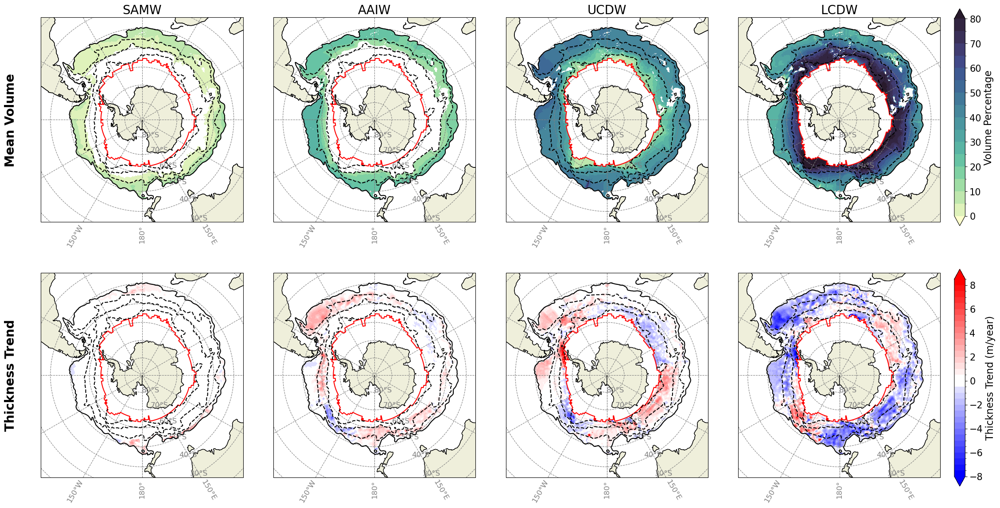

In [76]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import numpy.ma as ma
from scipy.ndimage import gaussian_filter
from matplotlib.colors import BoundaryNorm, ListedColormap
import cmocean

plt.rcParams.update({
    "font.size": 16,
    "axes.titlesize": 20,
    "axes.labelsize": 18,
    "xtick.labelsize": 15,
    "ytick.labelsize": 15,
    "legend.fontsize": 16
})

# =========================
# Custom colormap for thickness trends with white band between -0.5 and 0.5
# =========================
levels_UCDW_LCDW = np.arange(-8, 8.5 + 0.1, 0.5)
n_bins = len(levels_UCDW_LCDW) - 1
base = plt.get_cmap('bwr', n_bins)
colors = base(np.arange(n_bins))

i_start = np.where(levels_UCDW_LCDW == -0.5)[0][0]
i_end   = np.where(levels_UCDW_LCDW ==  0.5)[0][0] - 1
colors[i_start:i_end+1, :] = [1, 1, 1, 1]

colors_ext = np.vstack([colors[0], colors, colors[-1]])
colormap_trend = ListedColormap(colors_ext)
colormap_trend.set_bad('white')
norm_trend = BoundaryNorm(boundaries=levels_UCDW_LCDW,
                          ncolors=colormap_trend.N,
                          extend='both')

# =========================
# Smooth and mask thickness trends
# =========================
smoothed_SAMW = gaussian_filter(SAMW_thickness_trend, sigma=1, axes=1)
smoothed_AAIW = gaussian_filter(AAIW_thickness_trend, sigma=1, axes=1)
smoothed_UCDW = gaussian_filter(UCDW_thickness_trend, sigma=1, axes=1)
smoothed_LCDW = gaussian_filter(LCDW_thickness_trend, sigma=1, axes=1)

masked_SAMW = ma.masked_where(smoothed_SAMW == 0, smoothed_SAMW)
masked_AAIW = ma.masked_where(smoothed_AAIW == 0, smoothed_AAIW)
masked_UCDW = ma.masked_where(smoothed_UCDW == 0, smoothed_UCDW)
masked_LCDW = ma.masked_where(smoothed_LCDW == 0, smoothed_LCDW)

trend_data = [masked_SAMW, masked_AAIW, masked_UCDW, masked_LCDW]

# =========================
# Setup for mean volume fractions
# =========================
levels_vol = np.arange(0, 80 + 1, 5)
norm_vol = BoundaryNorm(levels_vol, ncolors=256, extend='both')
vol_data = [samw_fraction, aaiw_fraction, ucdw_fraction, lcdw_fraction]

# Column titles
col_titles = ["SAMW", "AAIW", "UCDW", "LCDW"]

# =========================
# Create combined figure
# =========================
fig, axes = plt.subplots(2, 4, figsize=(28, 14),
                         subplot_kw={'projection': ccrs.SouthPolarStereo()})
axes = axes.reshape(2, 4)

# Row 1: mean volumes
for j, (ax, data) in enumerate(zip(axes[0], vol_data)):
    ax.coastlines()
    ax.add_feature(cfeature.LAND, zorder=1, edgecolor='black')
    ax.set_extent([-180, 180, -90, -35], crs=ccrs.PlateCarree())
    gl = ax.gridlines(draw_labels=True, xlocs=range(-180, 181, 30),
                      linestyle='--', color='gray')
    gl.top_labels = False; gl.right_labels = False
    gl.xlabel_style = {'size': 12, 'color': 'gray'}
    gl.ylabel_style = {'size': 12, 'color': 'gray'}

    contour = ax.pcolormesh(
        ucdw_mean_volume_fraction.longitude,
        ucdw_mean_volume_fraction.latitude,
        data * 100, shading='nearest',
        cmap=cmocean.cm.deep, norm=norm_vol,
        transform=ccrs.PlateCarree()
    )
    ax.plot(longitude, sie_mask, 'r-', transform=ccrs.PlateCarree())
    ax.contour(ssh_contour_levels.longitude, ssh_contour_levels.latitude,
               ssh_contour_levels.data, levels=[-1.11,-0.65,-0.1,0.3],
               colors='k', transform=ccrs.PlateCarree())

    # Add column titles only at top row
    ax.set_title(col_titles[j], fontsize=20)

# Row 2: thickness trends
for j, (ax, data) in enumerate(zip(axes[1], trend_data)):
    ax.coastlines()
    ax.add_feature(cfeature.LAND, zorder=2, edgecolor='black')
    ax.set_extent([-180, 180, -90, -35], crs=ccrs.PlateCarree())
    gl = ax.gridlines(draw_labels=True, xlocs=range(-180, 181, 30),
                      linestyle='--', color='gray')
    gl.top_labels = False; gl.right_labels = False
    gl.xlabel_style = {'size': 12, 'color': 'gray'}
    gl.ylabel_style = {'size': 12, 'color': 'gray'}

    contour2 = ax.pcolormesh(
        UCDW_thickness_trend.longitude,
        UCDW_thickness_trend.latitude,
        data * 12, shading='nearest',
        cmap=colormap_trend, norm=norm_trend,
        transform=ccrs.PlateCarree()
    )
    ax.plot(longitude, sie_mask, 'r-', transform=ccrs.PlateCarree())
    ax.contour(ssh_contour_levels.longitude, ssh_contour_levels.latitude,
               ssh_contour_levels, levels=[-1.11, -0.65, -0.1, 0.3],
               colors='k', transform=ccrs.PlateCarree())

# =========================
# Row titles
# =========================
row_labels = ["Mean Volume", "Thickness Trend"]

for i, label in enumerate(row_labels):
    axes[i, 0].text(
        -0.15, 0.5, label,
        transform=axes[i, 0].transAxes,
        rotation=90, fontsize=20,
        va='center', ha='center', weight='bold'
    )

# =========================
# Shared colorbars
# =========================
# Colorbar for row 1 (Mean Volume)
cbar1 = fig.colorbar(
    contour, ax=axes[0, :], orientation='vertical',
    fraction=0.05, pad=0.02, ticks=levels_vol[::2]
)
cbar1.set_label('Volume Percentage', fontsize=16)

# Colorbar for row 2 (Thickness Trend)
cbar2 = fig.colorbar(
    contour2, ax=axes[1, :], orientation='vertical',
    fraction=0.05, pad=0.02, ticks=levels_UCDW_LCDW[::4], extend='both'
)
cbar2.set_label("Thickness Trend (m/year)", fontsize=16)

plt.subplots_adjust(right=0.85, wspace=0.15, hspace=0.15)  # shift plots left to make room

# plt.tight_layout()
# save_path = "/g/data/jk72/jw2777/Paper_2_figs/top_2000/combined_volumes_trends.png"
# plt.savefig(save_path, dpi=300, bbox_inches='tight')
plt.show()


# Figure 9: Circumpolar Volume, OHC and OSC decline

In [117]:
lcdw_normalised_volume = xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/lcdw_normalised_volume.nc').__xarray_dataarray_variable__
ucdw_normalised_volume = xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/ucdw_normalised_volume.nc').__xarray_dataarray_variable__
aaiw_normalised_volume = xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/aaiw_normalised_volume.nc').__xarray_dataarray_variable__
samw_normalised_volume = xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/samw_normalised_volume.nc').__xarray_dataarray_variable__

In [119]:

satGEM_SAMW_OHC_circumpolar_masked_area = xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/satGEM_SAMW_OHC_circumpolar_masked_area.nc').OHC
satGEM_AAIW_OHC_circumpolar_masked_area = xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/satGEM_AAIW_OHC_circumpolar_masked_area.nc').OHC
satGEM_UCDW_OHC_circumpolar_masked_area = xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/satGEM_UCDW_OHC_circumpolar_masked_area.nc').OHC
satGEM_LCDW_OHC_circumpolar_masked_area = xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/satGEM_LCDW_OHC_circumpolar_masked_area.nc').OHC

samw_normalised_OHC = satGEM_SAMW_OHC_circumpolar_masked_area.sum(dim=('latitude','longitude')) - satGEM_SAMW_OHC_circumpolar_masked_area.sum(dim=('latitude','longitude')).mean(dim='time')
aaiw_normalised_OHC = satGEM_AAIW_OHC_circumpolar_masked_area.sum(dim=('latitude','longitude')) - satGEM_AAIW_OHC_circumpolar_masked_area.sum(dim=('latitude','longitude')).mean(dim='time')
ucdw_normalised_OHC = satGEM_UCDW_OHC_circumpolar_masked_area.sum(dim=('latitude','longitude')) - satGEM_UCDW_OHC_circumpolar_masked_area.sum(dim=('latitude','longitude')).mean(dim='time')
lcdw_normalised_OHC = satGEM_LCDW_OHC_circumpolar_masked_area.sum(dim=('latitude','longitude')) - satGEM_LCDW_OHC_circumpolar_masked_area.sum(dim=('latitude','longitude')).mean(dim='time')

satGEM_SAMW_OSC_circumpolar_masked_area = xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/satGEM_SAMW_OSC_circumpolar_masked_area.nc').OSC
satGEM_AAIW_OSC_circumpolar_masked_area = xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/satGEM_AAIW_OSC_circumpolar_masked_area.nc').OSC
satGEM_UCDW_OSC_circumpolar_masked_area = xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/satGEM_UCDW_OSC_circumpolar_masked_area.nc').OSC
satGEM_LCDW_OSC_circumpolar_masked_area = xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/satGEM_LCDW_OSC_circumpolar_masked_area.nc').OSC

samw_normalised_OSC = satGEM_SAMW_OSC_circumpolar_masked_area.sum(dim=('latitude','longitude')) - satGEM_SAMW_OSC_circumpolar_masked_area.sum(dim=('latitude','longitude')).mean(dim='time')
aaiw_normalised_OSC = satGEM_AAIW_OSC_circumpolar_masked_area.sum(dim=('latitude','longitude')) - satGEM_AAIW_OSC_circumpolar_masked_area.sum(dim=('latitude','longitude')).mean(dim='time')
ucdw_normalised_OSC = satGEM_UCDW_OSC_circumpolar_masked_area.sum(dim=('latitude','longitude')) - satGEM_UCDW_OSC_circumpolar_masked_area.sum(dim=('latitude','longitude')).mean(dim='time')
lcdw_normalised_OSC = satGEM_LCDW_OSC_circumpolar_masked_area.sum(dim=('latitude','longitude')) - satGEM_LCDW_OSC_circumpolar_masked_area.sum(dim=('latitude','longitude')).mean(dim='time')



In [120]:
osc_series = {
    "SAMW": samw_normalised_OSC,
    "AAIW": aaiw_normalised_OSC,
    "UCDW": ucdw_normalised_OSC,
    "LCDW": lcdw_normalised_OSC,
}

ohc_series = {
    "SAMW": samw_normalised_OHC,
    "AAIW": aaiw_normalised_OHC,
    "UCDW": ucdw_normalised_OHC,
    "LCDW": lcdw_normalised_OHC,
}

vol_series = {
    "SAMW": samw_normalised_volume,
    "AAIW": aaiw_normalised_volume,
    "UCDW": ucdw_normalised_volume,
    "LCDW": lcdw_normalised_volume,
 }


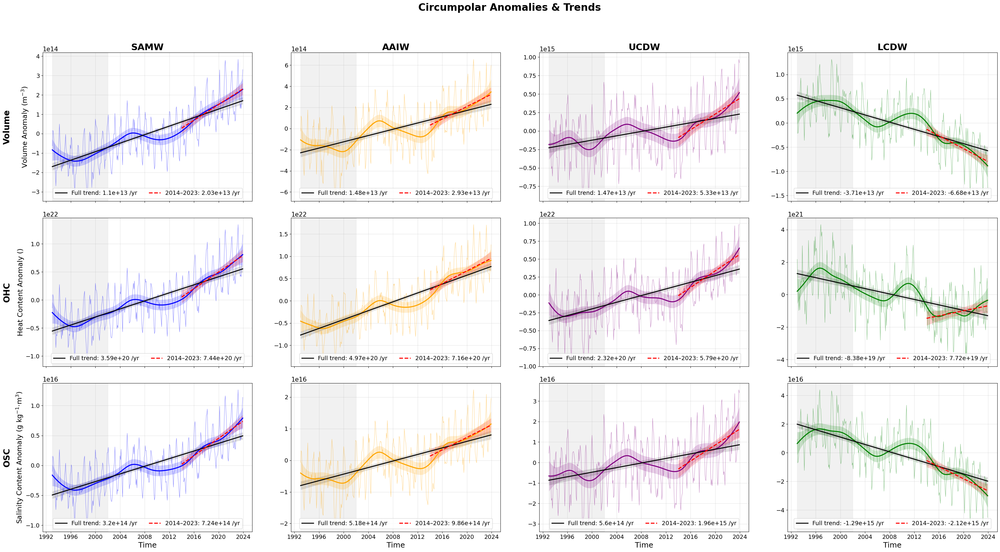

In [121]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pygam import GAM, s as spline
from scipy.stats import linregress, t

# ----- colors per water mass -----
WM_COLORS = {"SAMW": "blue", "AAIW": "orange", "UCDW": "purple", "LCDW": "green"}
WM_ORDER  = ["SAMW", "AAIW", "UCDW", "LCDW"]

# ---------- helpers ----------
def frac_year_from_da(time_da):
    t = pd.to_datetime(time_da.values)
    return t.year + t.dayofyear / 365.25, t

def regression_ci(x_num, y, confidence=0.95):
    slope, intercept, r_val, p_val, std_err = linregress(x_num, y)
    y_fit = intercept + slope * x_num
    n = len(y)
    if n < 3:
        return slope, intercept, r_val, p_val, y_fit, y_fit, y_fit
    resid = y - y_fit
    s_err = np.sqrt(np.sum(resid**2) / (n - 2))
    t_val = t.ppf((1 + confidence) / 2., n - 2)
    x_mean = np.mean(x_num)
    Sxx = np.sum((x_num - x_mean)**2)
    conf = t_val * s_err * np.sqrt(1/n + (x_num - x_mean)**2 / Sxx)
    return slope, intercept, r_val, p_val, y_fit, y_fit - conf, y_fit + conf


# =========================
# GAM fitting + trend plotting
# =========================
def fit_gam_full_and_lastdecade_osc(
    ax, time_da, data_da, label, series_color,
    last_decade=(2014, 2024),
    shade_extrap=(pd.to_datetime("1993-01-01"), pd.to_datetime("2002-01-01")),
    ylabel="Anomaly"
):
    # ---- clean & sort ----
    x_num_raw, t_raw = frac_year_from_da(time_da)
    y_raw = np.asarray(data_da.values, dtype=float)
    valid = np.isfinite(y_raw)
    x_num, t, y = x_num_raw[valid], t_raw[valid], y_raw[valid]
    order = np.argsort(t.values)
    x_num, t, y = x_num[order], t.values[order], y[order]
    if y.size < 5:
        ax.set_title(label)
        ax.text(0.5, 0.5, "Too few points", ha="center", va="center", transform=ax.transAxes)
        return {}

    # ---- Units ----
    units = ""
    if hasattr(data_da, "attrs") and "units" in data_da.attrs:
        units = data_da.attrs["units"]
    unit_str = f" {units}/yr" if units else " /yr"

    # ---- GAM (context) ----
    gam = GAM(spline(0)).fit(x_num, y)
    x_pred = np.linspace(x_num.min(), x_num.max(), 500)
    y_pred = gam.predict(x_pred)
    y_ci   = gam.confidence_intervals(x_pred, width=0.95)

    # Map x_pred back to datetimes
    t_ns = pd.to_datetime(t).astype("int64")
    t_pred_ns = np.interp(x_pred, x_num, t_ns)
    t_pred = pd.to_datetime(t_pred_ns)

    # ---- Full trend (black) ----
    slope_full, intercept_full, r_full, p_full, y_lin_full, y_lo_full, y_hi_full = \
        regression_ci(x_num, y, confidence=0.95)

    # ---- Last decade (red) ----
    years = pd.to_datetime(t).year
    start, end = last_decade
    m_last = (years >= start) & (years < end)
    have_last = m_last.sum() >= 2
    if have_last:
        x_last, y_last, t_last = x_num[m_last], y[m_last], pd.to_datetime(t[m_last])
        slope_last, intercept_last, r_last, p_last, y_lin_last, y_lo_last, y_hi_last = \
            regression_ci(x_last, y_last, confidence=0.95)

    # ---- plot ----
    # raw
    ax.plot(pd.to_datetime(t), y, lw=0.7, alpha=0.5, color=series_color)
    # GAM
    ax.plot(t_pred, y_pred, color=series_color, lw=2.4)
    ax.fill_between(t_pred, y_ci[:, 0], y_ci[:, 1], color=series_color, alpha=0.18, linewidth=0)

    # full trend
    full_label = f"Full trend: {slope_full:.3g}{unit_str}"
    ax.plot(pd.to_datetime(t), y_lin_full, color="k", lw=2.2, label=full_label)
    ax.fill_between(pd.to_datetime(t), y_lo_full, y_hi_full, color="k", alpha=0.12, linewidth=0)

    # last decade trend
    if have_last:
        last_label = f"{start}–{end-1}: {slope_last:.3g}{unit_str}"
        ax.plot(t_last, y_lin_last, color="red", lw=2.4, linestyle="--", label=last_label)
        ax.fill_between(t_last, y_lo_last, y_hi_last, color="red", alpha=0.18, linewidth=0)

    # cosmetics
    ax.set_title(label, fontsize=20, weight="bold")
    ax.set_ylabel(ylabel, fontsize=17)
    ax.grid(True, alpha=0.35)
    if shade_extrap is not None:
        ax.axvspan(shade_extrap[0], shade_extrap[1], color='lightgray', alpha=0.3, zorder=0)
    ax.legend(loc="lower center", ncols=2 if have_last else 1, frameon=True, fontsize=14)
    ax.tick_params(labelsize=14)
    return {
        "full_slope": slope_full, "full_p": p_full, "full_r2": r_full**2,
        "last_slope": (slope_last if have_last else np.nan),
        "last_p": (p_last if have_last else np.nan),
        "last_r2": (r_last**2 if have_last else np.nan)
    }


# =========================
# 3×4 main plotting function
# =========================
def plot_gam_3x4(vol_series, ohc_series, osc_series, savepath=None,
                 last_decade=(2014, 2024),
                 shade_extrap=(pd.to_datetime("1993-01-01"), pd.to_datetime("2002-01-01"))):

    # --- custom y-labels ---
    vol_ylabel = "Volume Anomaly (m$^{-3}$)"
    ohc_ylabel = "Heat Content Anomaly" + \
        (f" ({ohc_series[WM_ORDER[0]].attrs.get('units', '')})" if hasattr(ohc_series[WM_ORDER[0]], 'attrs') else "")
    osc_ylabel = "Salinity Content Anomaly (g kg$^{-1}$·m$^{3}$)"

    plt.rcParams.update({
        "font.size": 16, "axes.titlesize": 20, "axes.labelsize": 18,
        "xtick.labelsize": 15, "ytick.labelsize": 15, "legend.fontsize": 16
    })

    fig, axes = plt.subplots(3, 4, figsize=(34, 18), sharex=True)
    axes = np.asarray(axes)

    # --- row 0: Volume ---
    for j, wm in enumerate(WM_ORDER):
        fit_gam_full_and_lastdecade_osc(
            ax=axes[0, j],
            time_da=vol_series[wm].time,
            data_da=vol_series[wm],
            label="",  # suppress subplot title
            series_color=WM_COLORS[wm],
            last_decade=last_decade,
            shade_extrap=shade_extrap,
            ylabel=vol_ylabel if j == 0 else ""
        )

    # --- row 1: OHC ---
    for j, wm in enumerate(WM_ORDER):
        fit_gam_full_and_lastdecade_osc(
            ax=axes[1, j],
            time_da=ohc_series[wm].time,
            data_da=ohc_series[wm],
            label="",  # suppress subplot title
            series_color=WM_COLORS[wm],
            last_decade=last_decade,
            shade_extrap=shade_extrap,
            ylabel=ohc_ylabel if j == 0 else ""
        )

    # --- row 2: OSC ---
    for j, wm in enumerate(WM_ORDER):
        fit_gam_full_and_lastdecade_osc(
            ax=axes[2, j],
            time_da=osc_series[wm].time,
            data_da=osc_series[wm],
            label="",  # suppress subplot title
            series_color=WM_COLORS[wm],
            last_decade=last_decade,
            shade_extrap=shade_extrap,
            ylabel=osc_ylabel if j == 0 else ""
        )
        axes[2, j].set_xlabel("Time", fontsize=18)

    # ---- single column titles ----
    for j, wm in enumerate(WM_ORDER):
        axes[0, j].set_title(wm, fontsize=22, weight="bold")

    # ---- row headers on the left margin ----
    for i, header in enumerate(["Volume", "OHC", "OSC"]):
        axes[i, 0].annotate(
            header, xy=(-0.15, 0.5), xycoords='axes fraction',
            rotation=90, va='center', ha='right', fontsize=20, weight="bold"
        )

    fig.suptitle("Circumpolar Anomalies & Trends",
                 y=1.03, fontsize=24, weight="bold")
    fig.tight_layout()
    if savepath:
        fig.savefig(savepath, dpi=300, bbox_inches="tight")
    plt.show()


# --- RUN ---
plot_gam_3x4(vol_series, ohc_series, osc_series)


# Figure 10: OHC 

In [91]:
mean_OHC_mask=xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/mean_OHC_mask.nc').OHC
OHC_wc_trend=xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/OHC_wc_trend.nc').OHC_trend
OHC_masked=xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/OHC_masked.nc')

In [86]:
satGEM_WC_OHC_circumpolar_masked_area = OHC_masked.OHC

/jobfs/154533434.gadi-pbs/ipykernel_1412859/3191707117.py:23: DeprecationWarning: cftime_range() is deprecated, please use xarray.date_range(..., use_cftime=True) instead.
  time_num = xr.cftime_range(start=str(OHC_55S.time[0].values)[:10],
/jobfs/154533434.gadi-pbs/ipykernel_1412859/3191707117.py:138: DeprecationWarning: cftime_range() is deprecated, please use xarray.date_range(..., use_cftime=True) instead.
  time_num2 = xr.cftime_range(start=str(OHC_circ.time[0].values)[:10],


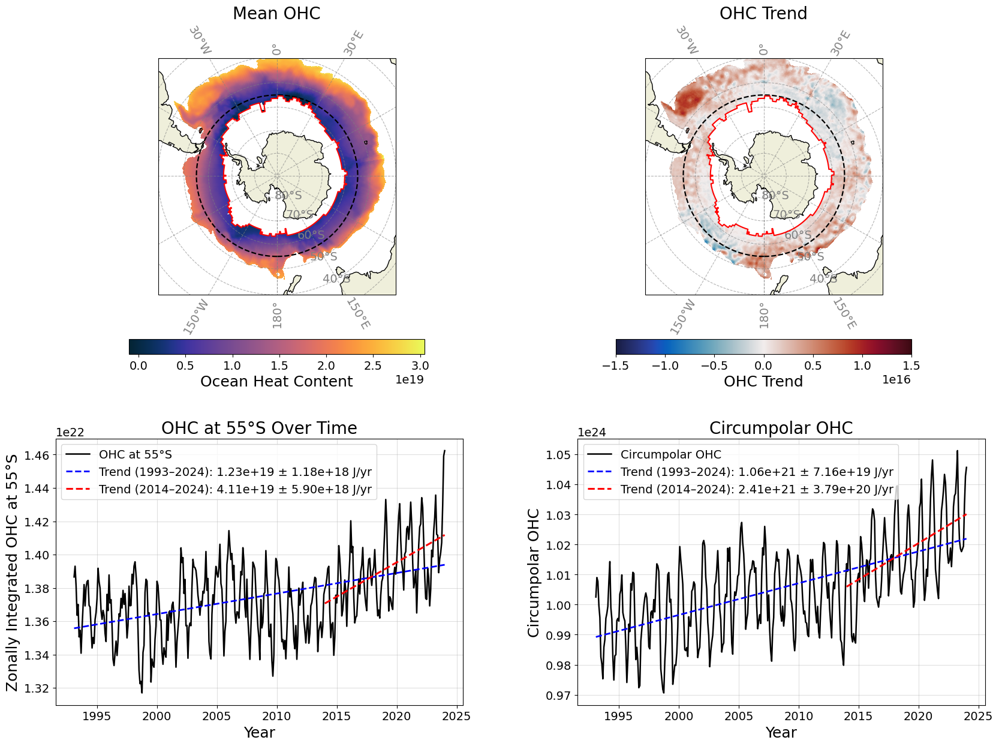

In [92]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cmocean
import xarray as xr
from scipy.stats import linregress

# --- global styling: larger fonts ---
plt.rcParams.update({
    "font.size": 16,
    "axes.titlesize": 20,
    "axes.labelsize": 18,
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,
    "legend.fontsize": 14,
})

# Compute OHC at 55S (zonal sum over longitude)
OHC_55S = satGEM_WC_OHC_circumpolar_masked_area.sel(latitude=-55, method='nearest').sum(dim='longitude')

# Numeric time for trend fitting (fractional years)
time_num = xr.cftime_range(start=str(OHC_55S.time[0].values)[:10],
                           periods=OHC_55S.sizes['time'], freq='MS')
years = np.array([t.year + t.month/12 for t in time_num])

# Linear trend for full time period
slope_all, intercept_all, _, _, _ = linregress(years, OHC_55S.values)
trend_all = slope_all * years + intercept_all

# Linear trend for 2014–2024
mask_recent = (years >= 2014) & (years <= 2024)
slope_recent, intercept_recent, _, _, _ = linregress(years[mask_recent], OHC_55S.values[mask_recent])
trend_recent = slope_recent * years[mask_recent] + intercept_recent

# ---- figure & layout: maps top row, series bottom spanning both ----
# ---- figure & layout: nested gridspecs for custom spacing ----
fig = plt.figure(figsize=(20, 14))

# More vertical gap between top (maps) and bottom (time series)
outer = fig.add_gridspec(nrows=2, ncols=1, height_ratios=[1.0, 0.9], hspace=0.30)

# Top row: keep maps relatively close to each other
gs_top = outer[0].subgridspec(nrows=1, ncols=2, wspace=0.10)

# Bottom row: give the two time series extra horizontal space
gs_bot = outer[1].subgridspec(nrows=1, ncols=2, wspace=0.28)

# --- Axes ---
proj = ccrs.SouthPolarStereo()
ax1 = fig.add_subplot(gs_top[0, 0], projection=proj)  # Mean OHC map
ax2 = fig.add_subplot(gs_top[0, 1], projection=proj)  # OHC trend map
ax3 = fig.add_subplot(gs_bot[0, 0])                   # 55°S time series
ax4 = fig.add_subplot(gs_bot[0, 1])                   # Circumpolar sum time series

# --- Temperature Map (top-left) ---
proj = ccrs.SouthPolarStereo()
# ax1 = fig.add_subplot(gs[0, 0], projection=proj)
ax1.coastlines()
ax1.add_feature(cfeature.LAND, zorder=1)
ax1.set_extent([-180, 180, -80, -40], crs=ccrs.PlateCarree())

gl1 = ax1.gridlines(draw_labels=True, xlocs=range(-180, 181, 30), linestyle='--', color='gray', alpha=0.6)
gl1.top_labels = True; gl1.right_labels = True
gl1.xlabel_style = gl1.ylabel_style = {'size': 14, 'color': 'gray'}

m1 = ax1.pcolormesh(
    mean_OHC_mask.longitude, mean_OHC_mask.latitude, mean_OHC_mask,
    shading='nearest', cmap=cmocean.cm.thermal, transform=ccrs.PlateCarree()
)
cb1 = fig.colorbar(m1, ax=ax1, orientation='horizontal', pad=0.15, fraction=0.05)
cb1.set_label('Ocean Heat Content', fontsize=18)
ax1.set_title("Mean OHC")
# 55°S line
lons = np.linspace(-180, 180, 500); lats = -55 * np.ones_like(lons)
ax1.plot(lons, lats, transform=ccrs.PlateCarree(), color='black', linewidth=1.6, linestyle='--')
ax1.plot(longitude, sie_mask, 'r-', transform=ccrs.PlateCarree(), label='Sea Ice Boundary')

# --- OHC Trend Map (top-right) ---
# ax2 = fig.add_subplot(gs[0, 1], projection=proj)
ax2.coastlines()
ax2.add_feature(cfeature.LAND, zorder=1)
ax2.set_extent([-180, 180, -80, -40], crs=ccrs.PlateCarree())

gl2 = ax2.gridlines(draw_labels=True, xlocs=range(-180, 181, 30), linestyle='--', color='gray', alpha=0.6)
gl2.top_labels = True; gl2.right_labels = True
gl2.xlabel_style = gl2.ylabel_style = {'size': 14, 'color': 'gray'}

m2 = ax2.pcolormesh(
    OHC_wc_trend.longitude, OHC_wc_trend.latitude, OHC_wc_trend,
    shading='nearest', vmin=-1.5e16, vmax=1.5e16,
    cmap=cmocean.cm.balance, transform=ccrs.PlateCarree()
)
cb2 = fig.colorbar(m2, ax=ax2, orientation='horizontal', pad=0.15, fraction=0.05)
cb2.set_label('OHC Trend', fontsize=18)
ax2.set_title("OHC Trend")
ax2.plot(lons, lats, transform=ccrs.PlateCarree(), color='black', linewidth=1.6, linestyle='--')
ax2.plot(longitude, sie_mask, 'r-', transform=ccrs.PlateCarree(), label='Sea Ice Boundary')

# --- Time series (bottom: left = 55°S, right = circumpolar sum) ---
# ax3 = fig.add_subplot(gs[1, 0])

# 55°S series (as before)
line_data, = ax3.plot(years, OHC_55S, label='OHC at 55°S', color='black', lw=1.8)
line_all,  = ax3.plot(years, trend_all, linestyle='--', color='blue', lw=2.0)
line_rec,  = ax3.plot(years[mask_recent], trend_recent, linestyle='--', color='red', lw=2.2)

# Refit for legend stats (55°S)
slope_all, intercept_all, r_all, p_all, se_all = linregress(years, OHC_55S.values)
mask_recent = (years >= 2014) & (years <= years.max())
slope_recent, intercept_recent, r_rec, p_rec, se_rec = linregress(
    years[mask_recent], OHC_55S.values[mask_recent]
)

units = getattr(OHC_55S, "attrs", {}).get("units", "J")
units_per_year = f"{units}/yr"

start_all = int(np.floor(years.min()))
end_all   = int(np.floor(years.max()))
start_rec = 2014
end_rec   = int(np.floor(years[mask_recent].max()))

line_all.set_label(f"Trend ({start_all}–{end_all}): {slope_all:.2e} ± {se_all:.2e} {units_per_year}")
line_rec.set_label(f"Trend ({start_rec}–{end_rec}): {slope_recent:.2e} ± {se_rec:.2e} {units_per_year}")
ax3.legend(handles=[line_data, line_all, line_rec], loc='upper left', frameon=True)

ax3.set_xlabel('Year', fontsize=18)
ax3.set_ylabel('Zonally Integrated OHC at 55°S', fontsize=18)
ax3.set_title('OHC at 55°S Over Time', fontsize=20)
ax3.grid(True, alpha=0.4)

# --- Circumpolar total (sum over latitude & longitude) ---
# ax4 = fig.add_subplot(gs[1, 1])

OHC_circ = satGEM_WC_OHC_circumpolar_masked_area.sum(dim=('latitude', 'longitude'))

# Numeric time for circumpolar series
time_num2 = xr.cftime_range(start=str(OHC_circ.time[0].values)[:10],
                            periods=OHC_circ.sizes['time'], freq='MS')
years2 = np.array([t.year + t.month/12 for t in time_num2])

# Full & recent trends (circumpolar)
slope_all2, intercept_all2, _, _, _ = linregress(years2, OHC_circ.values)
trend_all2 = slope_all2 * years2 + intercept_all2

mask_recent2 = (years2 >= 2014) & (years2 <= years2.max())
slope_recent2, intercept_recent2, _, _, _ = linregress(years2[mask_recent2], OHC_circ.values[mask_recent2])
trend_recent2 = slope_recent2 * years2[mask_recent2] + intercept_recent2

# Plot circumpolar series
line_data2, = ax4.plot(years2, OHC_circ.values, label='Circumpolar OHC', color='black', lw=1.8)
line_all2,  = ax4.plot(years2, trend_all2, linestyle='--', color='blue', lw=2.0)
line_rec2,  = ax4.plot(years2[mask_recent2], trend_recent2, linestyle='--', color='red', lw=2.2)

# Refit to get SE for legend (circumpolar)
slope_all2, intercept_all2, r_all2, p_all2, se_all2 = linregress(years2, OHC_circ.values)
slope_recent2, intercept_recent2, r_rec2, p_rec2, se_rec2 = linregress(
    years2[mask_recent2], OHC_circ.values[mask_recent2]
)

units2 = getattr(OHC_circ, "attrs", {}).get("units", "J")
units_per_year2 = f"{units2}/yr"

start_all2 = int(np.floor(years2.min()))
end_all2   = int(np.floor(years2.max()))
start_rec2 = 2014
end_rec2   = int(np.floor(years2[mask_recent2].max()))

line_all2.set_label(f"Trend ({start_all2}–{end_all2}): {slope_all2:.2e} ± {se_all2:.2e} {units_per_year2}")
line_rec2.set_label(f"Trend ({start_rec2}–{end_rec2}): {slope_recent2:.2e} ± {se_rec2:.2e} {units_per_year2}")
ax4.legend(handles=[line_data2, line_all2, line_rec2], loc='upper left', frameon=True)

ax4.set_xlabel('Year', fontsize=18)
ax4.set_ylabel('Circumpolar OHC', fontsize=18)
ax4.set_title('Circumpolar OHC', fontsize=20)
ax4.grid(True, alpha=0.4)

# plt.savefig('/g/data/jk72/jw2777/Paper_2_figs/top_2000/ohc_wc.png', dpi=300, bbox_inches='tight')
# plt.show()


# Figure 11: SSH trend

In [95]:
slope= xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/ssh_trend.nc').ssh_trend_per_year

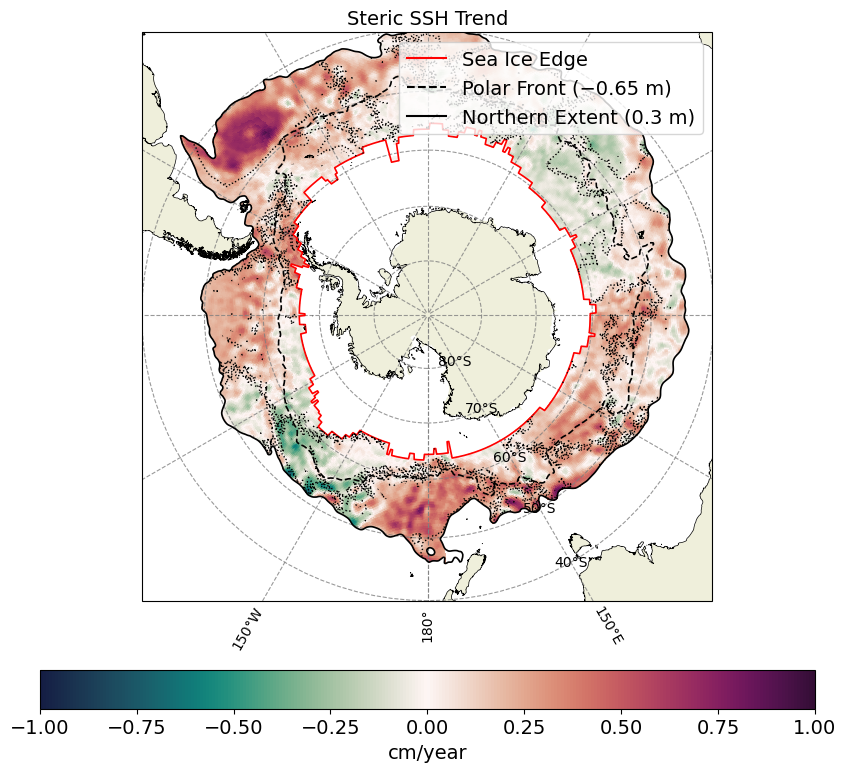

In [96]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import cmocean

etopo = xr.open_dataset(
    "/g/data/jk72/jw2777/from_v45/jw2777/Data/ETOPO1_Bed_c_gmt4.grd"
).sel(y=slice(-80, -30))

etopo = etopo.assign_coords(
    x=((etopo.x + 360) % 360)
).sortby('x')

etopo = etopo.sel(x=ssh_circumpolar_mean.longitude,y=ssh_circumpolar_mean.latitude,method='nearest')

etopo_masked = etopo.z.where(~area_mask[:,:1440])


# ==============
# South Polar style (white background, gray gridlines)
# ==============
def style_south_polar(ax, title=None):
    # Background and land
    ax.set_facecolor("white")  # white ocean background
    ax.add_feature(cfeature.LAND, zorder=1)  # solid black land
    ax.coastlines(resolution="10m", color="black", linewidth=0.5, zorder=2)

    # Extent and gridlines
    ax.set_extent([-180, 180, -80, -40], crs=ccrs.PlateCarree())
    gl = ax.gridlines(
        crs=ccrs.PlateCarree(),
        draw_labels=True,
        xlocs=np.arange(-180, 181, 30),
        ylocs=np.arange(-80, -39, 10),
        linestyle="--",
        linewidth=0.8,
        color="gray",
        alpha=0.8,
        zorder=3,
    )
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {"size": 10, "color": "black"}
    gl.ylabel_style = {"size": 10, "color": "black"}

    if title:
        ax.set_title(title, fontsize=14, pad=6)

# ==============
# Figure: only the map
# ==============
fig = plt.figure(figsize=(10, 9))
proj = ccrs.SouthPolarStereo()
ax_map = fig.add_subplot(1, 1, 1, projection=proj)
style_south_polar(ax_map, title="Steric SSH Trend")

# --- Filled trend field (example: slope * 100 to cm/yr) ---
pcm = ax_map.pcolormesh(
    slope.longitude, slope.latitude,
    slope * 100.0,
    vmin=-1, vmax=1, shading="nearest",
    cmap=cmocean.cm.curl,
    transform=ccrs.PlateCarree(),
    zorder=0,
)

# --- Sea-ice edge (line) ---
ax_map.plot(
    longitude, sie_mask, "r-", linewidth=1.2,
    transform=ccrs.PlateCarree(), zorder=5, label="Sea Ice Edge"
)

# --- Fronts / SSH contours ---
ax_map.contour(
    ssh_circumpolar_mean.longitude, ssh_circumpolar_mean.latitude, ssh_circumpolar_mean,
    levels=[-0.65], colors="black", linestyles="--", linewidths=1.2,
    transform=ccrs.PlateCarree(), zorder=5
)
ax_map.contour(
    ssh_circumpolar_mean.longitude, ssh_circumpolar_mean.latitude, ssh_circumpolar_mean,
    levels=[0.3], colors="black", linestyles="-", linewidths=1.2,
    transform=ccrs.PlateCarree(), zorder=5
)

# --- Optional bathymetry contour (e.g., -4000 m) ---
ax_map.contour(
    etopo_masked.longitude, etopo_masked.latitude, etopo_masked,
    levels=[-4000], colors="black", linestyles=":", linewidths=1.0,
    transform=ccrs.PlateCarree(), zorder=5
)

# --- Legend ---
from matplotlib.lines import Line2D
legend_handles = [
    Line2D([], [], color="red", linestyle="-", label="Sea Ice Edge"),
    Line2D([], [], color="black", linestyle="--", label="Polar Front (−0.65 m)"),
    Line2D([], [], color="black", linestyle="-", label="Northern Extent (0.3 m)"),
]
ax_map.legend(handles=legend_handles, loc="upper right")

# --- Colorbar ---
cbar = fig.colorbar(pcm, ax=ax_map, orientation="horizontal", pad=0.1, fraction=0.08)
cbar.set_label("cm/year", fontsize=14)

# # plt.tight_layout()
# plt.savefig('/g/data/jk72/jw2777/Paper_2_figs/top_2000/ssh_trend.png', dpi=300, bbox_inches='tight')
plt.show()


# Figure 12 - Wind stress

In [115]:
tau_x_all= xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/tau_x_annual_v2.nc').uas

In [98]:
tau_x_all

<xarray.DataArray 'uas' (year: 31, lat: 71, lon: 640)> Size: 6MB
[1408640 values with dtype=float32]
Coordinates:
  * year     (year) int64 248B 1993 1994 1995 1996 1997 ... 2020 2021 2022 2023
  * lat      (lat) float64 568B -79.47 -78.91 -78.35 ... -41.28 -40.72 -40.16
  * lon      (lon) float64 5kB 0.0 0.5625 1.125 1.688 ... 358.3 358.9 359.4
    height   float64 8B ...

In [100]:
import xarray as xr
import numpy as np
from scipy.stats import linregress

def linregress_1d(t, y):
    m = np.isfinite(t) & np.isfinite(y)
    if m.sum() < 2:
        return np.nan
    return linregress(t[m], y[m]).slope  # units of (data units) per year

# t as a DataArray aligned to the 'year' dim of tau_x_all
t_da = xr.DataArray(tau_x_all['year'].astype(float), dims=['year'])

trend = xr.apply_ufunc(
    linregress_1d,
    t_da,            # <-- first input: time vector on 'year'
    tau_x_all,       # <-- second input: data over 'year'
    input_core_dims=[['year'], ['year']],
    output_dtypes=[float],
    vectorize=True,
    dask='parallelized',
)

trend = trend.rename('tau_x_trend')
trend = trend.assign_attrs(units='N m^-2 / yr')  # Pa == N m^-2

trend_decade = (trend * 10).assign_attrs(units='N m^-2 / decade')


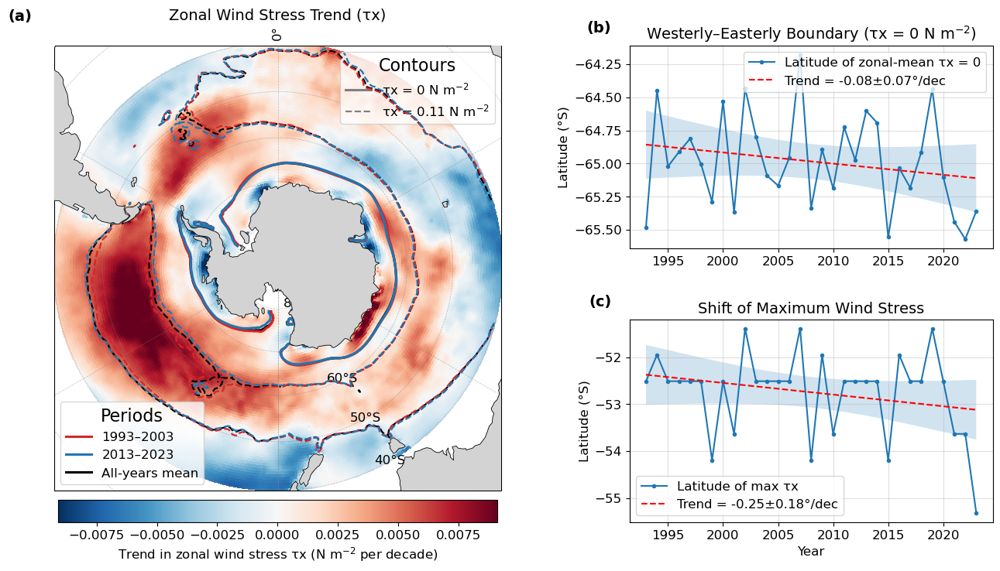

In [101]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from scipy.stats import linregress, t
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# --- helpers ---
def wrap_lon_180(da):
    if float(da.lon.max()) > 180:
        return da.assign_coords(lon=((da.lon + 180) % 360) - 180).sortby('lon')
    return da

def zero_crossing_lat(lat, f, target_lat=-60.0):
    latv = lat.values
    fv = f.values
    m = np.isfinite(latv) & np.isfinite(fv)
    latv, fv = latv[m], fv[m]
    if latv.size < 2:
        return np.nan
    s = np.sign(fv)
    idx = np.where(np.diff(s) != 0)[0]
    if idx.size == 0:
        return np.nan
    lats = []
    for i in idx:
        x0, x1 = latv[i], latv[i+1]
        y0, y1 = fv[i], fv[i+1]
        if y1 == y0:
            continue
        xz = x0 - y0 * (x1 - x0) / (y1 - y0)
        lats.append(xz)
    if not lats:
        return np.nan
    lats = np.array(lats)
    return lats[np.argmin(np.abs(lats - target_lat))]

# --- period means from tau_x_all(year, lat, lon) in N m^-2 ---
taux_early = tau_x_all.sel(year=slice(1993, 2003)).mean("year")
taux_late  = tau_x_all.sel(year=slice(2013, 2023)).mean("year")
taux_mean  = tau_x_all.mean("year")

taux_early = wrap_lon_180(taux_early)
taux_late  = wrap_lon_180(taux_late)
taux_mean  = wrap_lon_180(taux_mean)
trend_decade = wrap_lon_180(trend_decade)

# --- zonal mean (area-weighted) ---
weights = np.cos(np.deg2rad(tau_x_all.lat))
tau_x_zonal = tau_x_all.weighted(weights).mean(dim="lon")
years = tau_x_zonal.year.values.astype(float)

# --- zero-crossing latitude ---
zero_lat = np.array([zero_crossing_lat(tau_x_zonal.lat, tau_x_zonal.isel(year=i), target_lat=-60.0)
                     for i in range(tau_x_zonal.sizes['year'])])
m0 = np.isfinite(zero_lat)
x0, y0 = years[m0], zero_lat[m0]
slope0, intercept0, r0, p0, stderr0 = linregress(x0, y0)
n0 = len(x0)
tcrit0 = t.ppf(0.975, df=n0-2)
yhat0 = intercept0 + slope0 * x0
sse0 = np.sum((y0 - yhat0)**2)
s0 = np.sqrt(sse0 / (n0 - 2))
xbar0 = np.mean(x0)
Sxx0 = np.sum((x0 - xbar0)**2)
se_fit0 = s0 * np.sqrt(1/n0 + (x0 - xbar0)**2 / Sxx0)
yhat0_lo = yhat0 - tcrit0 * se_fit0
yhat0_hi = yhat0 + tcrit0 * se_fit0

# --- latitude of maximum τx ---
lat_of_max = np.array([tau_x_zonal.isel(year=i).lat[tau_x_zonal.isel(year=i).argmax(dim="lat")].item()
                       for i in range(tau_x_zonal.sizes['year'])])
m1 = np.isfinite(lat_of_max)
x1, y1 = years[m1], lat_of_max[m1]
slope1, intercept1, r1, p1, stderr1 = linregress(x1, y1)
n1 = len(x1)
tcrit1 = t.ppf(0.975, df=n1-2)
yhat1 = intercept1 + slope1 * x1
sse1 = np.sum((y1 - yhat1)**2)
s1 = np.sqrt(sse1 / (n1 - 2))
xbar1 = np.mean(x1)
Sxx1 = np.sum((x1 - xbar1)**2)
se_fit1 = s1 * np.sqrt(1/n1 + (x1 - xbar1)**2 / Sxx1)
yhat1_lo = yhat1 - tcrit1 * se_fit1
yhat1_hi = yhat1 + tcrit1 * se_fit1

# --- figure layout ---
ps = ccrs.SouthPolarStereo()
pc = ccrs.PlateCarree()
fig = plt.figure(figsize=(16, 8))
gs = fig.add_gridspec(nrows=2, ncols=2, width_ratios=[1.35, 1.0],
                      height_ratios=[1, 1], wspace=0.25, hspace=0.35)

# ===== Left panel: trend map =====
ax_map = plt.subplot(gs[:, 0], projection=ps)
ax_map.set_extent([-180, 180, -90, -40], crs=pc)
ax_map.add_feature(cfeature.LAND, facecolor='lightgray', zorder=100)
ax_map.coastlines('110m', linewidth=0.6, zorder=100)
gl = ax_map.gridlines(crs=pc, draw_labels=True, linewidth=0.5,
                      color='gray', alpha=0.5, linestyle='--')
gl.top_labels = True; gl.bottom_labels = False
gl.left_labels = True; gl.right_labels = True
gl.xlabel_style = {'size': 12}; gl.ylabel_style = {'size': 12}

# --- background: τx trend (N m^-2 per decade) ---
vmax = np.nanpercentile(np.abs(trend_decade.values), 98)
bg = ax_map.pcolormesh(
    trend_decade.lon, trend_decade.lat, trend_decade,
    transform=pc, shading='auto', cmap='RdBu_r',
    vmin=-vmax, vmax=vmax, zorder=1
)

# --- contours (τx = 0 and 0.11 N m^-2) ---
col_early = 'tab:red'
col_late  = 'tab:blue'
col_mean  = 'k'
for da, col, lab in [
    (taux_mean,  col_mean,  "Mean (all years)"),
    (taux_early, col_early, "1993–2003"),
    (taux_late,  col_late,  "2013–2023"),
]:
    ax_map.contour(da.lon, da.lat, da, levels=[0.0], colors=[col],
                   linewidths=2.2, linestyles='solid', transform=pc, zorder=20)
    ax_map.contour(da.lon, da.lat, da, levels=[0.11], colors=[col],
                   linewidths=1.6, linestyles='--', transform=pc, zorder=20)

# --- legends ---
period_handles = [
    Line2D([0],[0], color=col_early, lw=2.2, label='1993–2003'),
    Line2D([0],[0], color=col_late,  lw=2.2, label='2013–2023'),
    Line2D([0],[0], color=col_mean,  lw=2.2, label='All-years mean'),
]
style_handles = [
    Line2D([0],[0], color='gray', lw=2.2, ls='solid',  label='τx = 0 N m$^{-2}$'),
    Line2D([0],[0], color='gray', lw=1.6, ls='--',     label='τx = 0.11 N m$^{-2}$'),
]
leg1 = ax_map.legend(handles=period_handles, loc='lower left', frameon=True,
                     title="Periods", fontsize=12)
ax_map.add_artist(leg1)
ax_map.legend(handles=style_handles, loc='upper right', frameon=True,
              title="Contours", fontsize=12)
ax_map.text(-0.05, 1.05, "(a)", transform=ax_map.transAxes, fontsize=14,
            fontweight='bold', va='bottom', ha='right')

cb = fig.colorbar(bg, ax=ax_map, orientation='horizontal',
                  fraction=0.046, pad=0.02)
cb.set_label("Trend in zonal wind stress τx (N m$^{-2}$ per decade)", fontsize=12)
cb.ax.tick_params(labelsize=12)
ax_map.set_title("Zonal Wind Stress Trend (τx)", fontsize=14)

# ===== Right-top: zero-crossing =====
ax0 = plt.subplot(gs[0, 1])
ax0.plot(years, zero_lat, 'o-', ms=3, label="Latitude of zonal-mean τx = 0")
ax0.plot(x0, yhat0, 'r--',
         label=f"Trend = {slope0*10:.2f}±{stderr0*10:.2f}°/dec")
ax0.fill_between(x0, yhat0_lo, yhat0_hi, alpha=0.2, edgecolor='none')
ax0.set_ylabel("Latitude (°S)", fontsize=12)
ax0.set_title("Westerly–Easterly Boundary (τx = 0 N m$^{-2}$)", fontsize=14)
ax0.tick_params(axis='both', labelsize=12)
ax0.grid(True, alpha=0.4)
ax0.legend(loc='best', fontsize=12)
ax0.text(-0.05, 1.05, "(b)", transform=ax0.transAxes, fontsize=14,
         fontweight='bold', va='bottom', ha='right')

# ===== Right-bottom: latitude of max =====
ax1 = plt.subplot(gs[1, 1])
ax1.plot(years, lat_of_max, 'o-', ms=3, label="Latitude of max τx")
ax1.plot(x1, yhat1, 'r--',
         label=f"Trend = {slope1*10:.2f}±{stderr1*10:.2f}°/dec")
ax1.fill_between(x1, yhat1_lo, yhat1_hi, alpha=0.2, edgecolor='none')
ax1.set_xlabel("Year", fontsize=12)
ax1.set_ylabel("Latitude (°S)", fontsize=12)
ax1.set_title("Shift of Maximum Wind Stress", fontsize=14)
ax1.tick_params(axis='both', labelsize=12)
ax1.grid(True, alpha=0.4)
ax1.legend(loc='best', fontsize=12)
ax1.text(-0.05, 1.05, "(c)", transform=ax1.transAxes, fontsize=14,
         fontweight='bold', va='bottom', ha='right')


# save_path = "/g/data/jk72/jw2777/Paper_2_figs/top_2000/zonal_wind_shifts_v2.png"
# plt.savefig(save_path, dpi=300, bbox_inches='tight')

plt.show()


# Supplementary Figure 1:

/jobfs/154533434.gadi-pbs/ipykernel_1412859/520396653.py:87: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap("RdYlGn", num_colors)
/jobfs/154533434.gadi-pbs/ipykernel_1412859/520396653.py:122: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


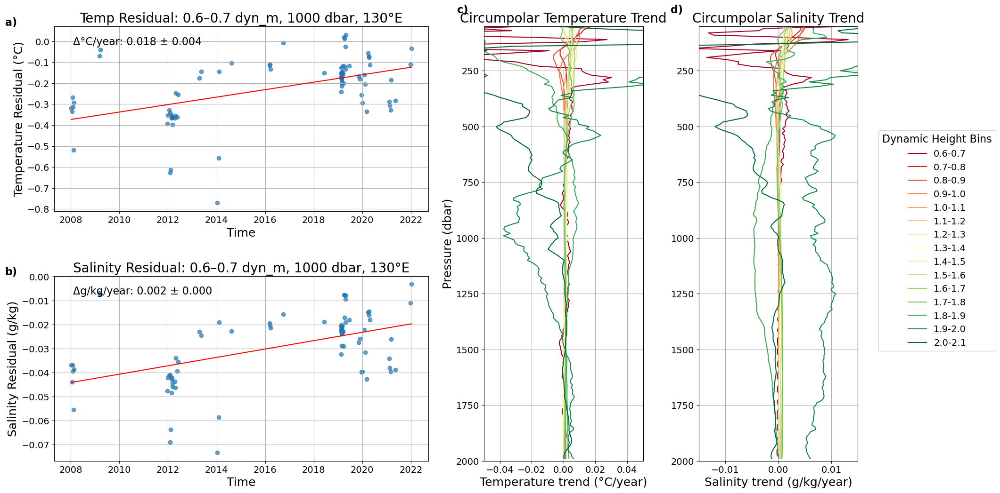

In [107]:
import numpy as np
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.gridspec as gridspec
from scipy.stats import linregress

# -----------------------------
# Load the saved data
# -----------------------------
path = "/g/data/jk72/jw2777/PAPER_2_CLEAN/data/figure_residuals_and_trends.nc"
ds   = xr.open_dataset(path)

# Residual time series
temp_time = pd.to_datetime(ds["time_temp"].values)
sal_time  = pd.to_datetime(ds["time_sal"].values)
y_temp    = np.asarray(ds["temp_residual"].values, dtype=float)
y_sal     = np.asarray(ds["sal_residual"].values, dtype=float)

# Circumpolar trend profiles
pressure  = np.asarray(ds["pressure"].values, dtype=float)
circ_temp = np.asarray(ds["circ_temp_trend"].values, dtype=float)  # shape: (pressure, bin_temp)
circ_sal  = np.asarray(ds["circ_sal_trend"].values, dtype=float)   # shape: (pressure, bin_sal)
bin_temp  = list(ds["bin_temp"].values.astype(str))
bin_sal   = list(ds["bin_sal"].values.astype(str))

# -----------------------------
# Recompute regressions (per year) for panels a,b
# -----------------------------
epoch = np.datetime64("1970-01-01")
t_temp_days = (temp_time.values - epoch) / np.timedelta64(1, "D")
t_sal_days  = (sal_time.values  - epoch) / np.timedelta64(1, "D")

# Mask NaNs
mT = np.isfinite(t_temp_days) & np.isfinite(y_temp)
mS = np.isfinite(t_sal_days)  & np.isfinite(y_sal)

res_temp = linregress(t_temp_days[mT], y_temp[mT])
res_sal  = linregress(t_sal_days[mS],  y_sal[mS])

# Convert slope/stderr from per-day to per-year
days_per_year = 365.25
slope_per_year_temp  = res_temp.slope  * days_per_year
stderr_per_year_temp = res_temp.stderr * days_per_year
slope_per_year_sal   = res_sal.slope   * days_per_year
stderr_per_year_sal  = res_sal.stderr  * days_per_year

trendline_temp = lambda t: res_temp.intercept + res_temp.slope * t
trendline_sal  = lambda t: res_sal.intercept  + res_sal.slope  * t

# -----------------------------
# Build figure (same layout/styles you used)
# -----------------------------
fig = plt.figure(figsize=(22, 12))
gs = gridspec.GridSpec(nrows=2, ncols=4, width_ratios=[1, 1, 1, 1], wspace=0.35, hspace=0.35)

lines, labels = [], []

# --- (a) Temperature residual scatter ---
ax0 = fig.add_subplot(gs[0, 0:2])
ax0.scatter(temp_time, y_temp, alpha=0.7)
ax0.plot(temp_time[mT], trendline_temp(t_temp_days[mT]), color="red")
ax0.set_title("Temp Residual: 0.6–0.7 dyn_m, 1000 dbar, 130°E")
ax0.set_xlabel("Time")
ax0.set_ylabel("Temperature Residual (°C)")
ax0.text(0.05, 0.9,
         f"Δ°C/year: {slope_per_year_temp:.3f} ± {stderr_per_year_temp:.3f}",
         transform=ax0.transAxes)
ax0.grid(True)

# --- (b) Salinity residual scatter ---
ax1 = fig.add_subplot(gs[1, 0:2])
ax1.scatter(sal_time, y_sal, alpha=0.7)
ax1.plot(sal_time[mS], trendline_sal(t_sal_days[mS]), color="red")
ax1.set_title("Salinity Residual: 0.6–0.7 dyn_m, 1000 dbar, 130°E")
ax1.set_xlabel("Time")
ax1.set_ylabel("Salinity Residual (g/kg)")
ax1.text(0.05, 0.9,
         f"Δg/kg/year: {slope_per_year_sal:.3f} ± {stderr_per_year_sal:.3f}",
         transform=ax1.transAxes)
ax1.grid(True)

# --- (c) Circumpolar Temperature Trend profiles ---
ax2 = fig.add_subplot(gs[0:2, 2])
num_colors = min(15, circ_temp.shape[1])
colors = cm.get_cmap("RdYlGn", num_colors)

for i in range(num_colors):
    line, = ax2.plot(circ_temp[:, i], pressure, label=bin_temp[i], color=colors(i))
    lines.append(line)
    labels.append(bin_temp[i])

ax2.set_xlabel("Temperature trend (°C/year)")
ax2.set_ylabel("Pressure (dbar)")
ax2.set_title("Circumpolar Temperature Trend")
ax2.grid(True)
ax2.set_xlim(-0.05, 0.05)
ax2.set_ylim(2000, 50)

# --- (d) Circumpolar Salinity Trend profiles ---
ax3 = fig.add_subplot(gs[0:2, 3])
for i in range(num_colors):
    ax3.plot(circ_sal[:, i], pressure, label=bin_sal[i], color=colors(i))

ax3.set_xlabel("Salinity trend (g/kg/year)")
ax3.set_title("Circumpolar Salinity Trend")
ax3.grid(True)
ax3.set_xlim(-0.015, 0.015)
ax3.set_ylim(2000, 50)

# Panel letters
ax0.text(-0.1, 1.05, "a)", transform=ax0.transAxes, fontsize=16, fontweight="bold", va="top", ha="right")
ax1.text(-0.1, 1.05, "b)", transform=ax1.transAxes, fontsize=16, fontweight="bold", va="top", ha="right")
ax2.text(-0.1, 1.05, "c)", transform=ax2.transAxes, fontsize=16, fontweight="bold", va="top", ha="right")
ax3.text(-0.1, 1.05, "d)", transform=ax3.transAxes, fontsize=16, fontweight="bold", va="top", ha="right")

# Shared legend outside right (for the temp panel; matches your pattern)
fig.legend(lines, labels, title="Dynamic Height Bins",
           bbox_to_anchor=(0.92, 0.5), loc="center left", borderaxespad=0.)

plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()


## Appendix 1: 

In [111]:
argo=xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/argo_swir.nc')
copernicus=xr.open_dataset('/g/data/jk72/jw2777/PAPER_2_CLEAN/data/copernicus_swir.nc')

In [112]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter
from scipy import interpolate as inter
import scipy.stats

cop_adt = []
dyn_m = []
profile_times = []

for i in range(len(argo.N_PROF)):
    profile = argo.dyn_m[i, -1]
    lat = float(argo.LATITUDE[i].values)
    lon = float(argo.LONGITUDE[i].values)
    time = argo.TIME[i].values

    try:
        adt_val = copernicus.sel(
            latitude=lat, method='nearest'
        ).sel(
            longitude=lon, method='nearest'
        ).sel(
            time=time, method='nearest'
        ).adt.values
    except:
        adt_val = np.nan  # if selection fails, assign NaN

    cop_adt.append(adt_val)
    dyn_m.append(float(profile.values))
    profile_times.append(time)

cop_adt_array = np.array(cop_adt)
dynm_array = np.array(dyn_m)
profile_times = np.array(profile_times)

# Remove NaNs
valid_mask = ~np.isnan(cop_adt_array)
cop_adt_array_no_nans = cop_adt_array[valid_mask]
dynm_array_no_nans = dynm_array[valid_mask]
time_no_nans = profile_times[valid_mask]

# Sort by cop_adt
order = np.argsort(cop_adt_array_no_nans)
cop_adt_ordered = cop_adt_array_no_nans[order]
dynm_array_ordered = dynm_array_no_nans[order]

# Fit line/spline
slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(
    cop_adt_ordered, dynm_array_ordered
)

/jobfs/154533434.gadi-pbs/ipykernel_1412859/2322317888.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cbar.ax.set_yticklabels(tick_labels, rotation=45)
/jobfs/154533434.gadi-pbs/ipykernel_1412859/2322317888.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cbar.ax.set_yticklabels(tick_labels, rotation=45)
/jobfs/154533434.gadi-pbs/ipykernel_1412859/2322317888.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cbar.ax.set_yticklabels(tick_labels, rotation=45)
/jobfs/154533434.gadi-pbs/ipykernel_1412859/2322317888.py:52: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  cbar.ax.set_yticklabels(tick_labels, rotation=45)


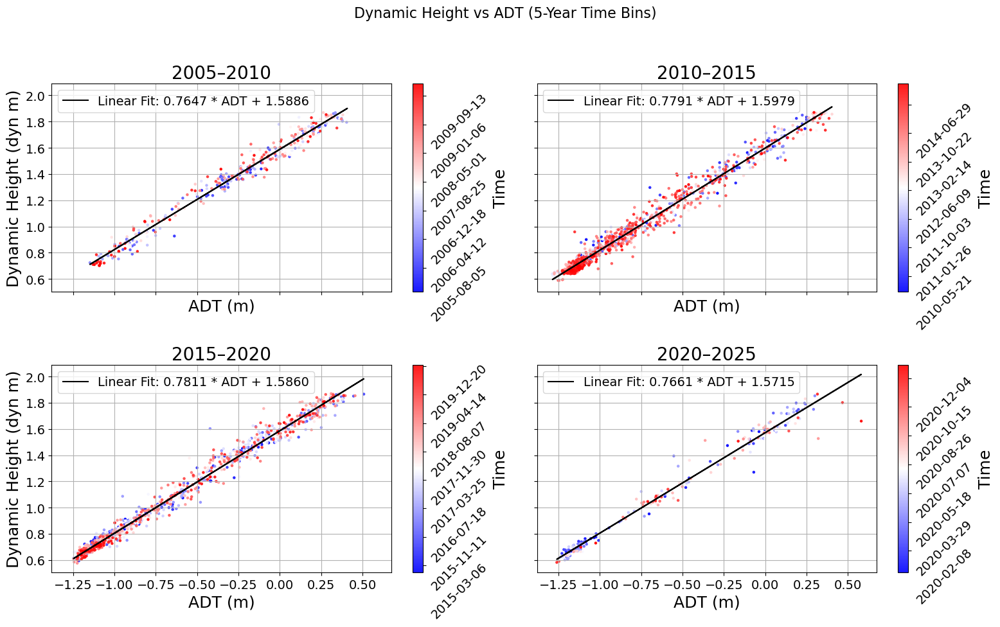

In [113]:
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats
import matplotlib.dates as mdates
import datetime

# Ensure time is in datetime64 format
time_no_nans_dt = np.array(time_no_nans).astype('datetime64[ns]')

# Define time bounds for each group
bins = [
    (np.datetime64('2005-01-01'), np.datetime64('2010-01-01'), "2005–2010"),
    (np.datetime64('2010-01-01'), np.datetime64('2015-01-01'), "2010–2015"),
    (np.datetime64('2015-01-01'), np.datetime64('2020-01-01'), "2015–2020"),
    (np.datetime64('2020-01-01'), np.datetime64('2025-01-01'), "2020–2025"),
]

# Group data by time bin
groups = []
for start, end, label in bins:
    mask = (time_no_nans_dt >= start) & (time_no_nans_dt < end)
    if np.any(mask):  # Skip empty bins
        groups.append((
            cop_adt_array_no_nans[mask],
            dynm_array_no_nans[mask],
            time_no_nans_dt[mask],
            label
        ))

# Plotting
fig, axs = plt.subplots(2, 2, figsize=(16, 10), sharex=True, sharey=True)
axs = axs.flatten()

for i, (adt, dyn, time_group, label) in enumerate(groups):
    slope, intercept, *_ = scipy.stats.linregress(adt, dyn)
    
    sc = axs[i].scatter(adt, dyn, c=time_group.astype('datetime64[D]').astype(float), cmap='bwr', s=5, alpha=0.9)
    axs[i].plot(adt, slope * adt + intercept, color='black', label=f"Linear Fit: {slope:.4f} * ADT + {intercept:.4f}")
    
    axs[i].set_title(label)
    axs[i].set_xlabel("ADT (m)")
    if i % 2 == 0:
        axs[i].set_ylabel("Dynamic Height (dyn m)")
    axs[i].legend()
    axs[i].grid()
    
    # Colorbar with datetime format
    cbar = fig.colorbar(sc, ax=axs[i], orientation='vertical')
    cbar.ax.set_ylabel('Time')
    tick_locs = cbar.get_ticks()
    tick_labels = [str(np.datetime64(int(t), 'D')) for t in tick_locs]
    cbar.ax.set_yticklabels(tick_labels, rotation=45)

plt.suptitle("Dynamic Height vs ADT (5-Year Time Bins)", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])

# save_path = "/g/data/jk72/jw2777/Paper_2_figs/SAF_NORTH/DHT_ADT.png"
# plt.savefig(save_path, dpi=300, bbox_inches='tight')

plt.show()
